In [1]:
import scanpy as sc
import anndata
import numpy as np
import pandas as pd
import sys
import importlib
import scipy as sci

sys.path.append(".")

import pickle
from autogenes import AutoGenes

/Users/bastiaanspanjaard/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
import random

In [3]:
%load_ext autoreload
%autoreload 1
%aimport autogenes

In [4]:
importlib.reload(autogenes)

<module 'autogenes' from '/Users/bastiaanspanjaard/Documents/Projects/heart_Bo/Scripts/jupyter/autogenes/__init__.py'>

In [5]:
#select replicate indices and save their mean
def removeReplicas(adata):
    #find genes with a '.' in their name
    noreplica = adata.var.loc[~adata.var.index.str.contains("\\."),:].index
    replicas = adata.var.loc[adata.var.index.str.contains("\\."),:].index
    uniques = set()
    new_var_names = set()
    for x in replicas: 
        uniques.add(x.split(".")[0])
        new_var_names.add(x.split(".")[0])
    new_var_names.update(noreplica.tolist())
    adata_new = sc.AnnData(np.zeros((len(adata.obs_names),len(new_var_names))))
    adata_new.var_names = list(new_var_names)
    adata_new.obs_names = adata.obs_names
    adata_new[:,noreplica].X = adata[:,noreplica].X
    adata_new.obs = adata.obs
    for x in uniques:
        ind = adata.var.loc[adata.var.index.str.contains(x),:].index
        if(len(ind)!=1):
            adata_new[:,x].X = np.mean(adata[:,ind].X,axis=1)
        else:
            adata_new[:,x].X =  adata[:,ind[0]].X
    return adata_new

# Read Tomo Data

In [6]:
#tomoData = pd.read_csv('../Data/Tomo1_DR11_count_table.csv',index_col=0) #Tomo1_count_table.csv
tomoData = pd.read_csv('~/Documents/Projects/heart_Bo/Data/Tomo2_DR11_count_table.csv',index_col=0)
print(tomoData.shape)
tomoData.head()

(22530, 63)


,28,29,30,31,33,34,35,36,37,38,...,82,83,84,85,86,87,89,90,91,94
Gene,,,,,,,,,,,,,,,,,,,,,
a1cf,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
a2ml,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
aaas,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
aacs,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aadac,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
tomoaData_normalized = sc.AnnData(tomoData.T)
print(tomoaData_normalized)
tomoaData_normalized = removeReplicas(tomoaData_normalized)
print(tomoaData_normalized)

AnnData object with n_obs × n_vars = 63 × 22530 


/Users/bastiaanspanjaard/anaconda3/lib/python3.6/site-packages/anndata/core/anndata.py:846: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


AnnData object with n_obs × n_vars = 63 × 20855 


In [8]:
tomoaData_dataframe = pd.DataFrame(data=tomoaData_normalized.X.T,index=tomoaData_normalized.var_names,columns=tomoaData_normalized.obs_names)
#tomoaData_dataframe.to_csv(r'../write/cleaned_ids.csv')

In [9]:
tomoaData_dataframe.shape

(20855, 63)

In [10]:
sc.pp.normalize_per_cell(tomoaData_normalized, counts_per_cell_after=1e4)
tomoData_norm = pd.DataFrame(data=tomoaData_normalized.X.T,columns = tomoaData_normalized.obs_names, index=tomoaData_normalized.var_names)

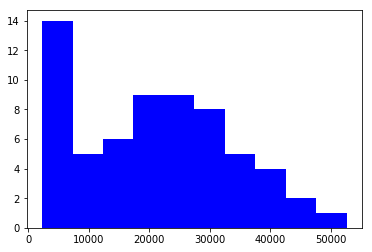

In [11]:
import seaborn as sb
import matplotlib.pyplot as plt
counts = pd.DataFrame(data=tomoData.T.sum(1),index= tomoData.columns)
raw_counts = counts
counts = counts.T
counts = counts[counts>1000]
counts = counts.iloc[0].apply(pd.to_numeric)
counts = counts.dropna()
plt.hist(counts, color='blue')
plt.show()

In [12]:
counts_proc = counts.drop(['74'], axis=0)
counts_proc.shape

(62,)

In [13]:
sc.set_figure_params(dpi=200, dpi_save=300, vector_friendly=True, frameon=False)

In [14]:
plt.rcParams['figure.figsize'] = (6, 4)

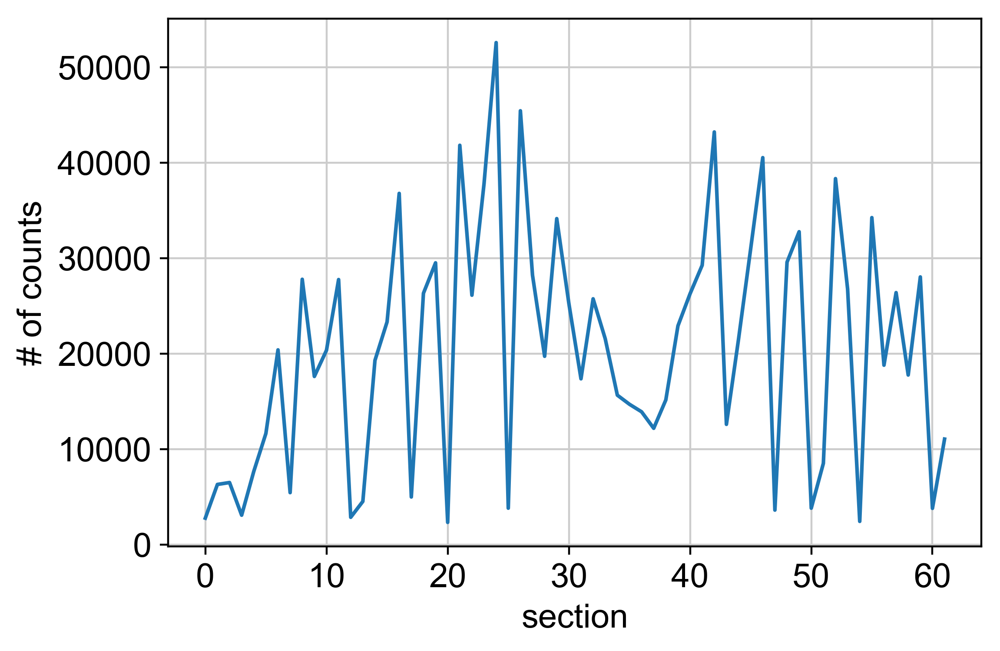

In [16]:
#print(counts_proc.shape)
fig, ax = plt.subplots()
x_pos = [i for i, _ in enumerate(counts_proc.index)]
#print(x_pos)
plt.xlabel('section')
plt.ylabel('# of counts')
ax.plot(x_pos,counts_proc)

In [17]:
import os
print(os.getcwd())

/Users/bastiaanspanjaard/Documents/Projects/heart_Bo/Scripts/jupyter


# Read single-cell data

In [18]:
file_1 = '../../Data/all_h5_transfer/H5_Dr11_cr31_ffbm.h5'
file_2 = '../../Data/all_h5_transfer/H6_Dr11_cr31_ffbm.h5'
file_3 = '../../Data/all_h5_transfer/H7_Dr11_cr31_ffbm.h5'
file_4 = '../../Data/all_h5_transfer/H8a_Dr11_cr31_ffbm.h5'
file_5 = '../../Data/all_h5_transfer/H8v_Dr11_cr31_ffbm.h5'

adata_1 = sc.read_10x_h5(file_1)
adata_2 = sc.read_10x_h5(file_2)
adata_3 = sc.read_10x_h5(file_3)
adata_4 = sc.read_10x_h5(file_4)
adata_5 = sc.read_10x_h5(file_5)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [19]:
adata_1.var_names_make_unique()
adata_2.var_names_make_unique()
adata_3.var_names_make_unique()
adata_4.var_names_make_unique()
adata_5.var_names_make_unique()

In [20]:
adata=adata_1.concatenate([adata_2,adata_3,adata_4,adata_5],
                                      batch_key='sample',
                                      batch_categories=['H5','H6','H7','H8a','H8v'])
adata.X = adata.X.todense()

In [20]:
#test = adata[:,adata.var_names.str.startswith('NC_002333.')].X
#np.mean(test,axis=0)

In [21]:
#tomoData.index.intersection(adata.var_names)

## AutoGeneS

In [21]:
#read annotations
# Update annotation?
#annotations = pd.read_csv('../../Data/all.hearts.all.cells.all.sub.sept03.csv',index_col=0)
#annotations = pd.read_csv('../../Data/celltypes_zoom_allcells.csv',index_col=0)
#annotations = pd.read_csv('../data/all.hearts.all.cells.all.sub.sept03.csv',index_col=0)
annotations_nonery = pd.read_csv('../../Data/final_metadata_Tmacromerged.csv', index_col = 0)
annotations_ery = pd.read_csv('../../Data/final_erythrocytes.csv', index_col=0)

/Users/bastiaanspanjaard/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (8,30) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [22]:
print(annotations_nonery.shape)
annotations_nonery.head()

(202255, 31)


,orig.ident,nCount_RNA,nFeature_RNA,percent.mito,time,morphine,AV,inhib,so.far.ident.subtypes,so.far.ident,...,RNA_snn_res.2,RNA_snn_res.3,RNA_snn_res.3.5,work.ident2,work.ident3,final.zoom,lineage.ident,Cell_type,Celltype,Cell_name
Cell,,,,,,,,,,,,,,,,,,,,,
H5_AAACCTGAGACTACAA,H5,1112,337,17.535971,Ctrl,Ctrl,Wholeheart,NaN,Atrium,CM (Atrium),...,19,10,10,Cardiomyocytes,Cardiomyocytes A,Cardiomyocytes A,Cardiomyocytes A,Cardiomyocytes A,NaN,ndH5_AAACCTGAGACTACAA
H5_AAACGGGAGGCGCTCT,H5,834,366,6.714628,Ctrl,Ctrl,Wholeheart,NaN,Atrium,CM (Atrium),...,14,35,27,Cardiomyocytes,Cardiomyocytes A,Cardiomyocytes A,Cardiomyocytes A,Cardiomyocytes A,NaN,ndH5_AAACGGGAGGCGCTCT
H5_AAAGATGAGATCCCAT,H5,1604,510,1.807980,Ctrl,Ctrl,Wholeheart,NaN,Atrium,CM (Atrium),...,31,23,27,Cardiomyocytes,Cardiomyocytes A,Cardiomyocytes A,Cardiomyocytes A,Cardiomyocytes A,NaN,ndH5_AAAGATGAGATCCCAT
H5_AAAGATGCATCAGTCA,H5,3244,577,4.562269,Ctrl,Ctrl,Wholeheart,NaN,Atrium,CM (Atrium),...,14,23,27,Cardiomyocytes,Cardiomyocytes A,Cardiomyocytes A,Cardiomyocytes A,Cardiomyocytes A,NaN,ndH5_AAAGATGCATCAGTCA
H5_AAAGATGTCGATAGAA,H5,1079,426,7.321594,Ctrl,Ctrl,Wholeheart,NaN,Atrium,CM (Atrium),...,14,35,27,Cardiomyocytes,Cardiomyocytes A,Cardiomyocytes A,Cardiomyocytes A,Cardiomyocytes A,NaN,ndH5_AAAGATGTCGATAGAA


In [23]:
annotations_ery.columns = ['orig.ident', 'Cell_type']
#print(annotations_ery.shape)
#annotations_ery.head()

(71518, 2)


,orig.ident,Cell_type
H5_AAACGGGGTCCAAGTT,H5,Erythrocytes
H5_AAAGATGTCCCAAGAT,H5,Erythrocytes
H5_AAAGCAACATCAGTCA,H5,Erythrocytes
H5_AAAGCAAGTTGGAGGT,H5,Erythrocytes
H5_AAAGTAGAGTCTCAAC,H5,Erythrocytes


In [24]:
#annotations_nonery[['orig.ident', 'Cell_type']]

,orig.ident,Cell_type
Cell,,
H5_AAACCTGAGACTACAA,H5,Cardiomyocytes A
H5_AAACGGGAGGCGCTCT,H5,Cardiomyocytes A
H5_AAAGATGAGATCCCAT,H5,Cardiomyocytes A
H5_AAAGATGCATCAGTCA,H5,Cardiomyocytes A
H5_AAAGATGTCGATAGAA,H5,Cardiomyocytes A
H5_AAATGCCGTACCGCTG,H5,Cardiomyocytes A
H5_AACACGTAGAAACGCC,H5,Cardiomyocytes A
H5_AACACGTTCTTCAACT,H5,Cardiomyocytes A
H5_AACCATGAGAGCCCAA,H5,Cardiomyocytes A


In [25]:
annotations = pd.concat([annotations_nonery[['orig.ident', 'Cell_type']], annotations_ery])

In [26]:
#annotations.tail()

,orig.ident,Cell_type
Hr35_TTTGTTGGTACACGTT,Hr35,Erythrocytes
Hr35_TTTGTTGGTACCTGTA,Hr35,Erythrocytes
Hr35_TTTGTTGGTATGAGAT,Hr35,Erythrocytes
Hr35_TTTGTTGGTGGAATGC,Hr35,Erythrocytes
Hr35_TTTGTTGTCTCCTACG,Hr35,Erythrocytes


In [27]:
indices = [x for x in annotations.index if not x.startswith('Hr')]
annotations = annotations.loc[indices,:]

In [28]:
adata.obs_names = [str(adata.obs.loc[x,'sample'])+'_'+str(x.split('-', 1)[0]) for x in adata.obs_names]

In [30]:
#[str(adata.obs.loc[x,'sample'])+'_'+str(x.split('-', 1)[0]) for x in adata.obs_names]

In [29]:
#adata.obs_names

Index(['H5_AAACCTGAGACTACAA', 'H5_AAACCTGAGCACGCCT', 'H5_AAACCTGAGGATGTAT',
       'H5_AAACCTGAGTCCATAC', 'H5_AAACCTGAGTGAATTG', 'H5_AAACCTGGTCTCATCC',
       'H5_AAACCTGTCACGCATA', 'H5_AAACCTGTCAGCTCTC', 'H5_AAACCTGTCCGAACGC',
       'H5_AAACGGGAGCCTTGAT',
       ...
       'H8v_TTTGTCACACTATCTT', 'H8v_TTTGTCACAGCTGGCT', 'H8v_TTTGTCAGTAAGCACG',
       'H8v_TTTGTCAGTGCAGTAG', 'H8v_TTTGTCAGTTATCACG', 'H8v_TTTGTCATCAAGCCTA',
       'H8v_TTTGTCATCATGCATG', 'H8v_TTTGTCATCCTAGGGC', 'H8v_TTTGTCATCGAATCCA',
       'H8v_TTTGTCATCTCCGGTT'],
      dtype='object', length=36745)

In [32]:
#annotations.index

Index(['H5_AAACCTGAGACTACAA', 'H5_AAACGGGAGGCGCTCT', 'H5_AAAGATGAGATCCCAT',
       'H5_AAAGATGCATCAGTCA', 'H5_AAAGATGTCGATAGAA', 'H5_AAATGCCGTACCGCTG',
       'H5_AACACGTAGAAACGCC', 'H5_AACACGTTCTTCAACT', 'H5_AACCATGAGAGCCCAA',
       'H5_AACCGCGAGTGTCTCA',
       ...
       'H8v_TTGGAACCAATTCCTT', 'H8v_TTGGAACCATCCGGGT', 'H8v_TTGTAGGCACAACGCC',
       'H8v_TTTACTGCAATGTAAG', 'H8v_TTTACTGGTCTTGTCC', 'H8v_TTTACTGTCTCGGACG',
       'H8v_TTTATGCTCAACACTG', 'H8v_TTTGCGCCACATGGGA', 'H8v_TTTGGTTAGGAGTTGC',
       'H8v_TTTGGTTTCGCATGAT'],
      dtype='object', length=26707)

In [56]:
# For some reason, the below cells are not 'valid' cell names in the adata object
# so I'm removing them from the annotations manually.
#annotations = annotations.drop(['H5_ACACCGGAGCTGCCCA', 'H5_CCTAAAGGTGACAAAT', 'H5_GAAGCAGTCCGCATAA', 
#                  'H5_GCTTCCAGTACAAGTA', 'H5_GTAGTCACATGCCTAA', 'H5_TTTCCTCTCGAACTGT', 
#                  'H6_CGGCTAGTCTGAAAGA', 'H6_GCTTCCACAAAGCAAT', 'H6_GGCGACTCAGTTCATG', 
#                  'H6_TACTTACAGGTAGCTG', 'H6_TCGTAGAAGAAGATTC', 'H7_ACGATGTGTGGCAAAC', 
#                  'H7_ACGCAGCCATCGATTG', 'H7_AGAGCTTAGAGGTTAT', 'H7_AGTAGTCCACCTCGGA', 
#                  'H7_ATCCACCGTGAGTGAC', 'H7_ATTGGACGTAGAAGGA', 'H7_CAAGAAAAGCTACCGC', 
#                  'H7_CACACCTCAGCCTGTG', 'H7_CACCAGGGTTCAGTAC', 'H7_CAGATCACAATGAATG', 
#                  'H7_CAGTCCTGTCACTTCC', 'H7_CATCAGATCTCTAGGA', 'H7_CTCGTCACAAGGTTCT', 
#                  'H7_CTGCTGTGTTCTGAAC', 'H7_CTTAACTGTTAAGAAC', 'H7_GATCGCGCACTGAAGG', 
#                  'H7_GCAGTTAGTAGCTAAA', 'H7_GGAACTTGTCGCGGTT', 'H7_TAGAGCTCAAACAACA', 
#                  'H7_TCACAAGAGCCTCGTG', 'H7_TTAGGACCAATCCGAT', 'H7_TTAGGACCATGGATGG', 
#                  'H8a_CACATAGTCCCTAACC', 'H8a_GCAATCAAGACTTTCG', 'H8v_GTGGGTCAGGAGCGTT', 
#                  'H8v_TGCGGGTTCAGATAAG', 'H8v_TGTGGTATCAACCATG'])
annotations = annotations.drop(['H5_ACACCGGAGCTGCCCA', 'H5_CCTAAAGGTGACAAAT', 'H5_GAAGCAGTCCGCATAA', 
                  'H5_GCTTCCAGTACAAGTA', 'H5_TTTCCTCTCGAACTGT', 
                  'H6_GCTTCCACAAAGCAAT', 
                  'H6_TACTTACAGGTAGCTG', 'H6_TCGTAGAAGAAGATTC', 
                  'H7_ACGCAGCCATCGATTG', 'H7_AGAGCTTAGAGGTTAT', 'H7_AGTAGTCCACCTCGGA', 
                  'H7_ATCCACCGTGAGTGAC', 'H7_ATTGGACGTAGAAGGA', 'H7_CAAGAAAAGCTACCGC', 
                  'H7_CACACCTCAGCCTGTG', 'H7_CAGATCACAATGAATG', 
                  'H7_CAGTCCTGTCACTTCC', 'H7_CATCAGATCTCTAGGA', 'H7_CTCGTCACAAGGTTCT', 
                  'H7_CTGCTGTGTTCTGAAC', 'H7_GATCGCGCACTGAAGG', 
                  'H7_GCAGTTAGTAGCTAAA', 'H7_GGAACTTGTCGCGGTT', 'H7_TAGAGCTCAAACAACA', 
                  'H7_TCACAAGAGCCTCGTG', 'H7_TTAGGACCAATCCGAT', 'H7_TTAGGACCATGGATGG', 
                  'H8a_CACATAGTCCCTAACC', 'H8a_GCAATCAAGACTTTCG', 'H8v_GTGGGTCAGGAGCGTT', 
                  'H8v_TGTGGTATCAACCATG'])

In [34]:
#annotations.shape

(26676, 2)

In [57]:
adata_proc = adata[annotations.index]
#adata_proc = adata[adata.obs_names.intersection(annotations.index)]
#annotations_filter = annotations[annotations.index.isin(adata.obs_names.intersection(annotations.index))]

#adata_proc
#adata[['H5_AAACCTGAGACTACAA', 'H5_AAACCTGAGCACGCCT', 'H5_AAACCTGAGGATGTAT',
#       'H5_AAACCTGAGTCCATAC', 'H5_AAACCTGAGTGAATTG', 'H5_AAACCTGGTCTCATCC',
#       'H5_AAACCTGTCACGCATA', 'H5_AAACCTGTCAGCTCTC', 'H5_AAACCTGTCCGAACGC',
#       'H5_AAACGGGAGCCTTGAT']]

In [58]:
for s in annotations.columns.values:
    #adata_proc.obs[s] = annotations_filter[s].tolist()
    adata_proc.obs[s] = annotations[s].tolist()

Trying to set attribute `.obs` of view, making a copy.


In [59]:
adata_proc = removeReplicas(adata_proc)

/Users/bastiaanspanjaard/anaconda3/lib/python3.6/site-packages/anndata/core/anndata.py:846: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


In [55]:
#adata_proc.obs

,sample,orig.ident,Cell_type,n_counts
H5_AAACCTGAGACTACAA,H5,H5,Cardiomyocytes A,926.00
H5_AAACCTGAGCACGCCT,H5,H5,Cardiomyocytes A,2235.00
H5_AAACCTGAGGATGTAT,H5,H5,Cardiomyocytes A,7214.00
H5_AAACCTGAGTCCATAC,H5,H5,Cardiomyocytes A,1661.00
H5_AAACCTGAGTGAATTG,H5,H5,Cardiomyocytes A,6254.25
H5_AAACCTGGTCTCATCC,H5,H5,Cardiomyocytes A,5321.00
H5_AAACCTGTCACGCATA,H5,H5,Cardiomyocytes A,699.00
H5_AAACCTGTCCGAACGC,H5,H5,Cardiomyocytes A,672.00
H5_AAACGGGAGCCTTGAT,H5,H5,Cardiomyocytes A,2165.00
H5_AAACGGGAGCTAGTGG,H5,H5,Cardiomyocytes A,1020.00


In [54]:
#annotations.tail()

,orig.ident,Cell_type
H8v_TTTACTGTCTCGGACG,H8v,Erythrocytes
H8v_TTTATGCTCAACACTG,H8v,Erythrocytes
H8v_TTTGCGCCACATGGGA,H8v,Erythrocytes
H8v_TTTGGTTAGGAGTTGC,H8v,Erythrocytes
H8v_TTTGGTTTCGCATGAT,H8v,Erythrocytes


In [60]:
for s in annotations.columns.values:
    adata_proc.obs[s] = annotations[s].tolist()

In [61]:
#select shared genes between sc and tomo data
adata_proc = adata_proc[:,adata_proc.var_names.intersection(tomoData_norm.index)]
tomoData_norm = tomoData_norm.loc[adata_proc.var_names.intersection(tomoData_norm.index),:]

In [62]:
print(adata_proc)
tomoData_norm.shape

View of AnnData object with n_obs × n_vars = 26676 × 16636 
    obs: 'sample', 'orig.ident', 'Cell_type'


(16636, 63)

In [63]:
adata_norm = sc.pp.normalize_per_cell(adata_proc, counts_per_cell_after=1e4,copy=True)
adata_proc = sc.pp.log1p(adata_norm, copy=True)
sc.pp.highly_variable_genes(adata_proc, flavor='seurat', n_top_genes=4000)
#sc.pp.scale(adata_proc)

... storing 'orig.ident' as categorical
... storing 'Cell_type' as categorical


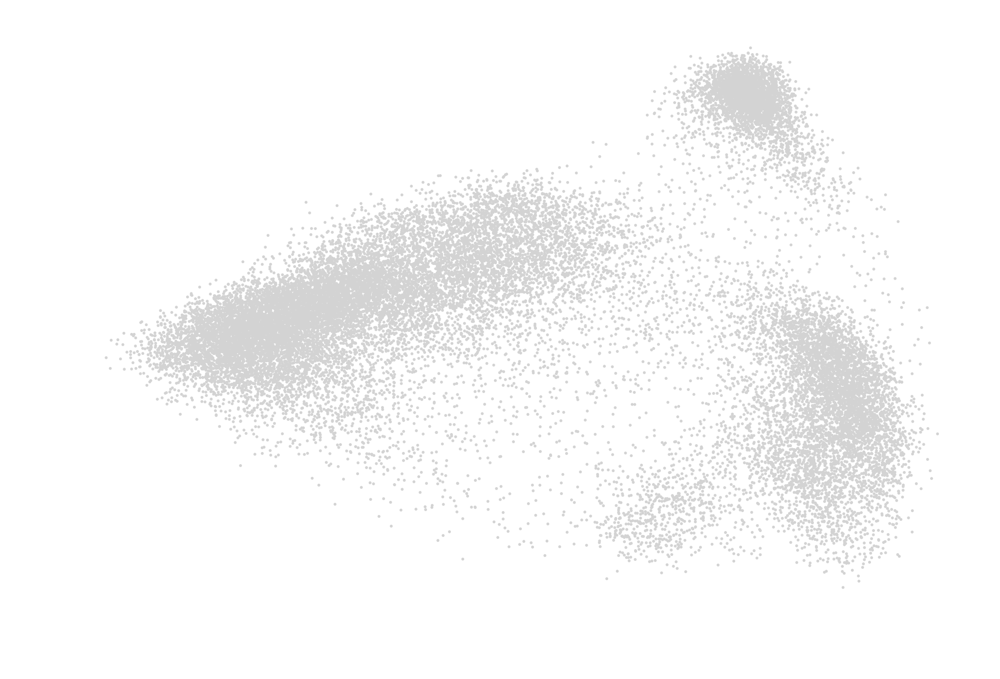

In [64]:
sc.tl.pca(adata_proc)
adata_proc.obsm['X_pca'] *= -1  # multiply by -1 to match Seurat
sc.pl.pca_scatter(adata_proc, save="_PCA.png" )

In [65]:
#sc.tl.tsne(adata_proc, n_jobs=3, perplexity=10, n_pcs = 30)

In [66]:
sc.pp.neighbors(adata_proc, n_neighbors=30)
sc.tl.umap(adata_proc)

In [67]:
adata_proc

AnnData object with n_obs × n_vars = 26676 × 16636 
    obs: 'sample', 'orig.ident', 'Cell_type', 'n_counts'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

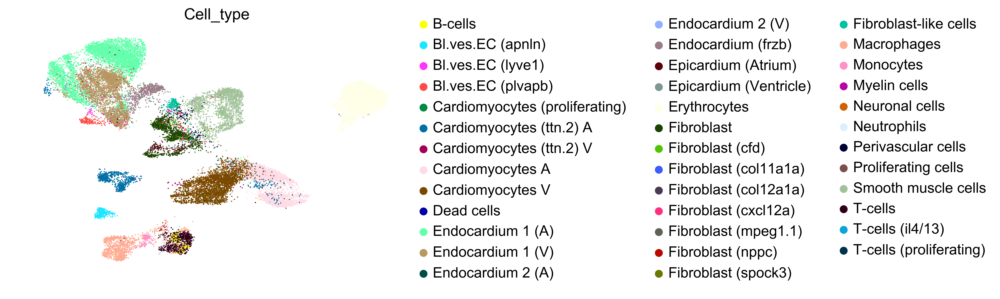

In [68]:
#sc.pl.tsne(adata_proc, color='big.Cell.type')
#sc.pl.umap(adata_proc, color='big.Cell.type')
#sc.pl.tsne(adata_proc, color='orig.ident')
#sc.pl.umap(adata_proc, color='orig.ident')
sc.pl.umap(adata_proc, color='Cell_type')

In [60]:
#adata_proc.obs.Cell_type.value_counts()

Endocardium 1 (A)                 4956
Erythrocytes                      3664
Cardiomyocytes V                  3148
Endocardium 1 (V)                 3109
Cardiomyocytes A                  2976
Smooth muscle cells               2035
Macrophages                       1292
Fibroblast                        1167
Cardiomyocytes (ttn.2) A           913
T-cells                            785
Endocardium (frzb)                 688
Bl.ves.EC (apnln)                  334
Fibroblast-like cells              216
Bl.ves.EC (plvapb)                 196
B-cells                            186
Monocytes                          172
Epicardium (Atrium)                131
Fibroblast (cxcl12a)               117
Fibroblast (cfd)                   108
Perivascular cells                  80
Epicardium (Ventricle)              75
Bl.ves.EC (lyve1)                   54
Cardiomyocytes (ttn.2) V            41
Neutrophils                         38
Myelin cells                        37
Fibroblast (spock3)      

# Deconvolution

In [ ]:
adata_norm.obs = adata_proc.obs

In [ ]:
clusters = list(set(adata_norm.obs['Cell_type']))
sc_mean = pd.DataFrame(index=adata_norm.var_names,columns=clusters)
for cluster in clusters:
    sc_part = adata_norm[adata_norm.obs_names[adata_norm.obs['Cell_type']==cluster]].X.T
    sc_mean[cluster] = pd.DataFrame(sc_part.mean(axis=1),index=adata_norm.var_names)
centroids_sc = sc_mean
print(centroids_sc.shape)

In [ ]:
centroids_sc_hv = centroids_sc.loc[adata_proc[:,adata_proc.var['highly_variable']==True].var_names,:]

In [ ]:
centroids_sc_hv = centroids_sc_hv.drop('Dead cells', axis=1)
centroids_sc_hv.shape

In [ ]:
centroids_sc_hv.columns

## AutoGeneS

In [ ]:
ag = AutoGenes(centroids_sc_hv.T)
ag.run(ngen=2000,seed=0,nfeatures=300,mode='fixed')

In [99]:
#import pickle
#with open('ag_5000gen_seed0_nfeatures300.pickle', 'wb') as handle:
#    pickle.dump(ag, handle)

#with open('ag_5000gen_seed0_nfeatures300.pickle', 'rb') as handle:
#    b = pickle.load(handle)
    
#print(ag == b)

AttributeError: Can't pickle local object 'GeneticAlgorithm.__init__.<locals>.<lambda>'

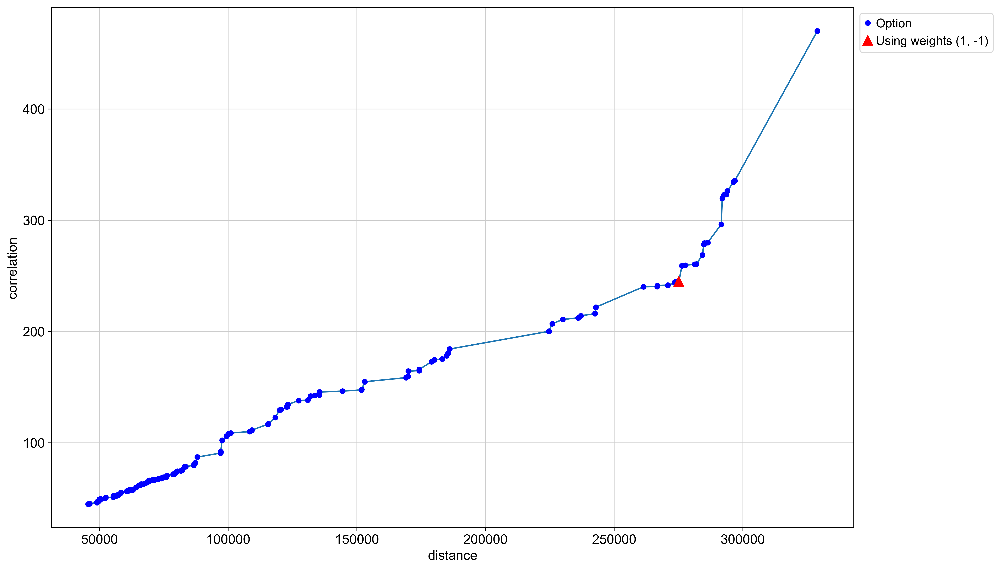

In [53]:
ag.plot(size='large',weights=(1,-1))

In [54]:
pareto = ag.pareto

In [55]:
len(pareto)

259

In [57]:
centroids_sc_pareto = centroids_sc_hv[pareto[240]]#ag.select(weights=(1,-1)) -->422
centroids_sc_pareto.shape

(300, 37)

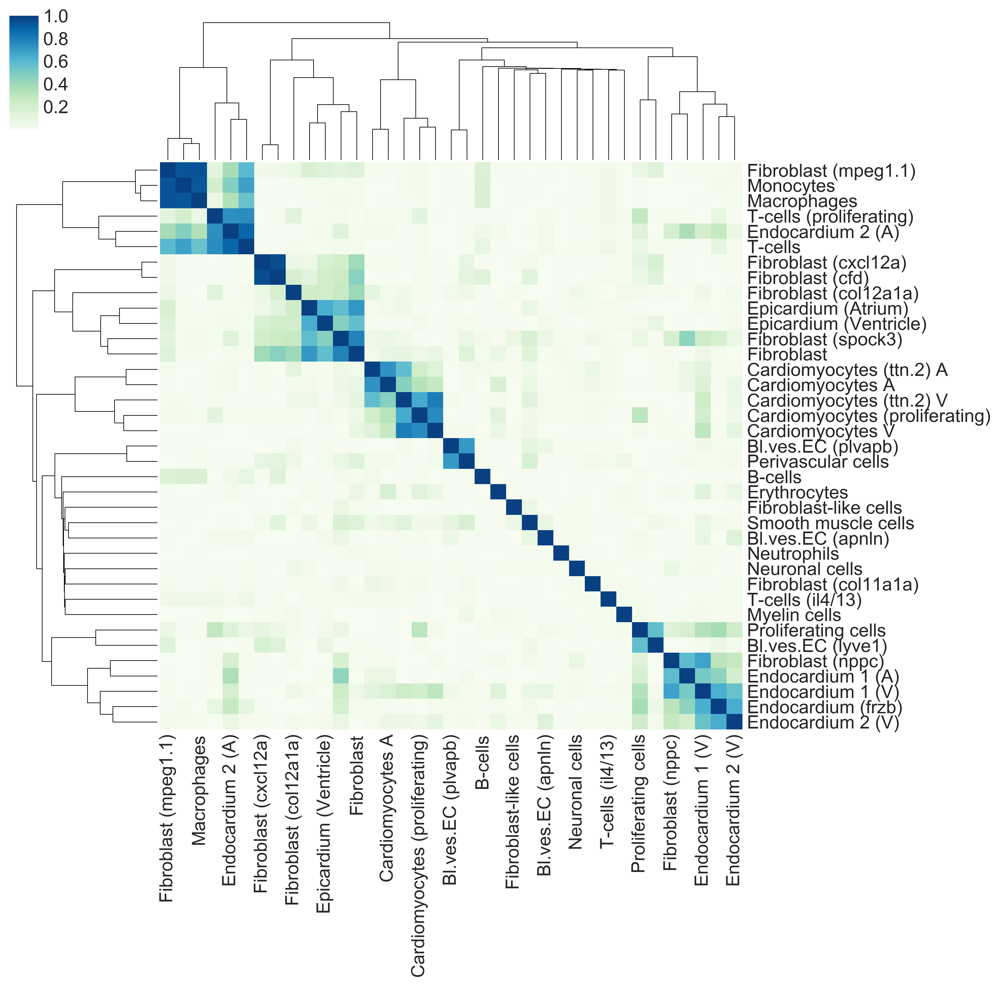

In [59]:
import seaborn as sns
corr = pd.DataFrame(data = np.corrcoef(centroids_sc_pareto.T), columns = centroids_sc_pareto.columns, index = centroids_sc_pareto.columns)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    sns_plot =sns.clustermap(np.abs(corr),cmap=sns.color_palette("GnBu", 1000), robust=True, yticklabels=1)


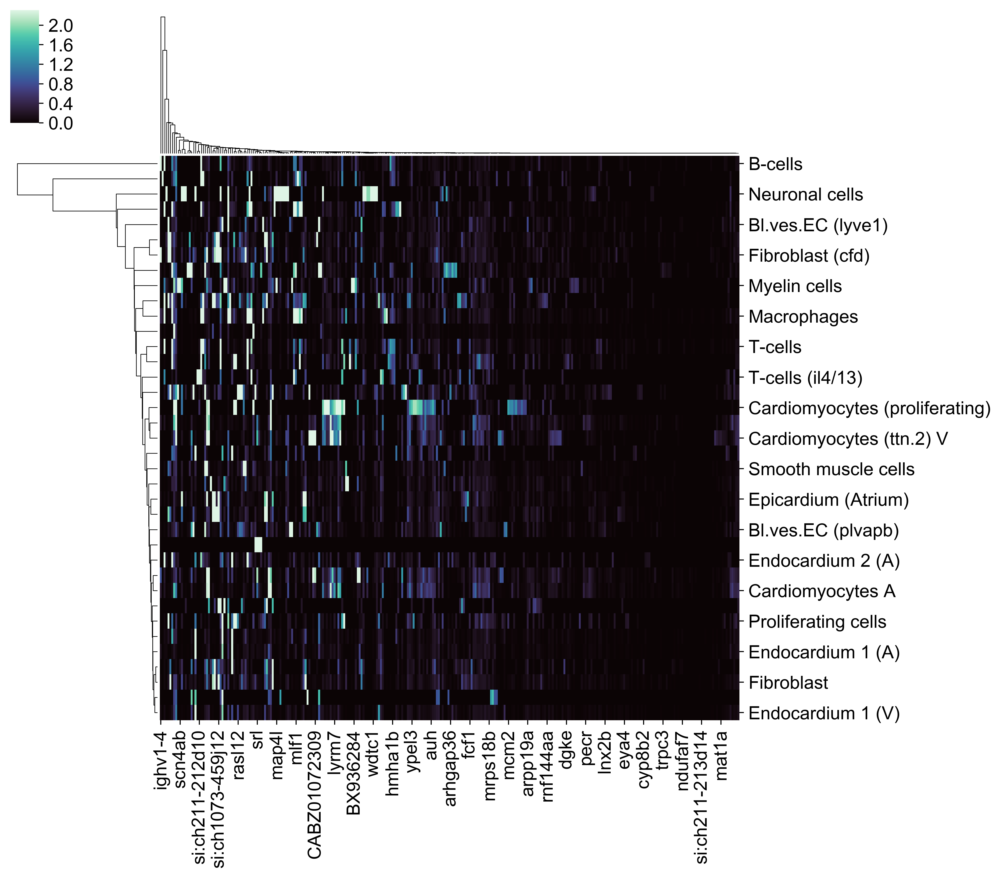

In [61]:
import seaborn as sns
subTypes = pd.DataFrame
subTypes = centroids_sc_pareto.columns
type_pal = sns.husl_palette(centroids_sc_pareto.columns.size, s=0.7)
lut = dict(zip(centroids_sc_pareto.columns.unique(), type_pal))
row_colors = subTypes.map(lut)
sns_plot = sns.clustermap(centroids_sc_pareto.T, cmap="mako", robust=True) #, cmap="mako", robust=True, row_cluster = False)
#sns_plot.figure.savefig(figdir+"heatmap_GA.png",dpi=300)

## Regression

In [62]:
tomoData_hv = tomoData_norm.loc[centroids_sc_hv.index,:] # Tomo-expression of highly-variable genes
tomoData_pareto = tomoData_norm.loc[centroids_sc_pareto.index,:] # Tomo-expression of pareto genes

In [63]:
def normalize_proportions(data,copy):
    if copy==True:
        data_copy = data.copy()
    else:
        data_copy = data
    data_copy[data_copy < 0] = 0
    for raw in data_copy.index:
        sum = data_copy.loc[raw].sum()
        if sum!=0:
            data_copy.loc[raw] = np.divide(data_copy.loc[raw],sum)
        else:
            data_copy.loc[raw] = 0
    return data_copy

In [80]:
from sklearn.svm import NuSVR
from sklearn import linear_model
#ag.bulk_deconvolution(tomoData_norm.loc[centroids_sc_hv.index,:].T,model=NuSVR)
proportions_NuSVR = pd.DataFrame(index=tomoData_hv.columns,columns=centroids_sc_pareto.columns)
# proportions_NuSVR is tomo-section x celltype dataframe
# Fit each tomo-section in terms of its pareto genes to the cell types, using a support vector regression.
for s in tomoData_hv.columns:
    model = NuSVR(nu=0.3,C=0.3,kernel='linear')
    model.fit(centroids_sc_pareto,tomoData_pareto.loc[:,s])
    proportions_NuSVR.loc[s] = model.coef_[0]
# Remove negative coefficients and normalize so each section adds up to 1
proportions_NuSVR_norm = normalize_proportions(proportions_NuSVR, copy = True)

In [81]:
# Fit each tomo-section in terms of its pareto genes to the cell types, using non-negative least squares.
proportions_nnls = pd.DataFrame(index=tomoData_hv.columns,columns=centroids_sc_pareto.columns)
for s in tomoData_hv.columns:
    proportions_nnls.loc[s] = sci.optimize.nnls(centroids_sc_pareto,tomoData_pareto.loc[:,s])[0]
    #proportions_nnls.loc[s] = model.coef_[0]
proportions_nnls_norm = normalize_proportions(proportions_nnls, copy = True)

In [84]:
proportions_NuSVR_norm.columns

Index(['Fibroblast (nppc)', 'Fibroblast (cxcl12a)', 'Proliferating cells',
       'Endocardium (frzb)', 'Neuronal cells', 'Smooth muscle cells',
       'Endocardium 2 (A)', 'Fibroblast (mpeg1.1)', 'Monocytes', 'T-cells',
       'Endocardium 2 (V)', 'Fibroblast (spock3)',
       'Cardiomyocytes (proliferating)', 'Fibroblast', 'Fibroblast (cfd)',
       'Epicardium (Atrium)', 'T-cells (il4/13)', 'Bl.ves.EC (lyve1)',
       'Fibroblast (col11a1a)', 'Cardiomyocytes V', 'Fibroblast-like cells',
       'B-cells', 'Cardiomyocytes (ttn.2) A', 'Cardiomyocytes (ttn.2) V',
       'Epicardium (Ventricle)', 'Bl.ves.EC (plvapb)', 'Myelin cells',
       'Perivascular cells', 'Fibroblast (col12a1a)', 'Endocardium 1 (A)',
       'Cardiomyocytes A', 'Macrophages', 'Neutrophils', 'Bl.ves.EC (apnln)',
       'Endocardium 1 (V)', 'Erythrocytes', 'T-cells (proliferating)'],
      dtype='object')

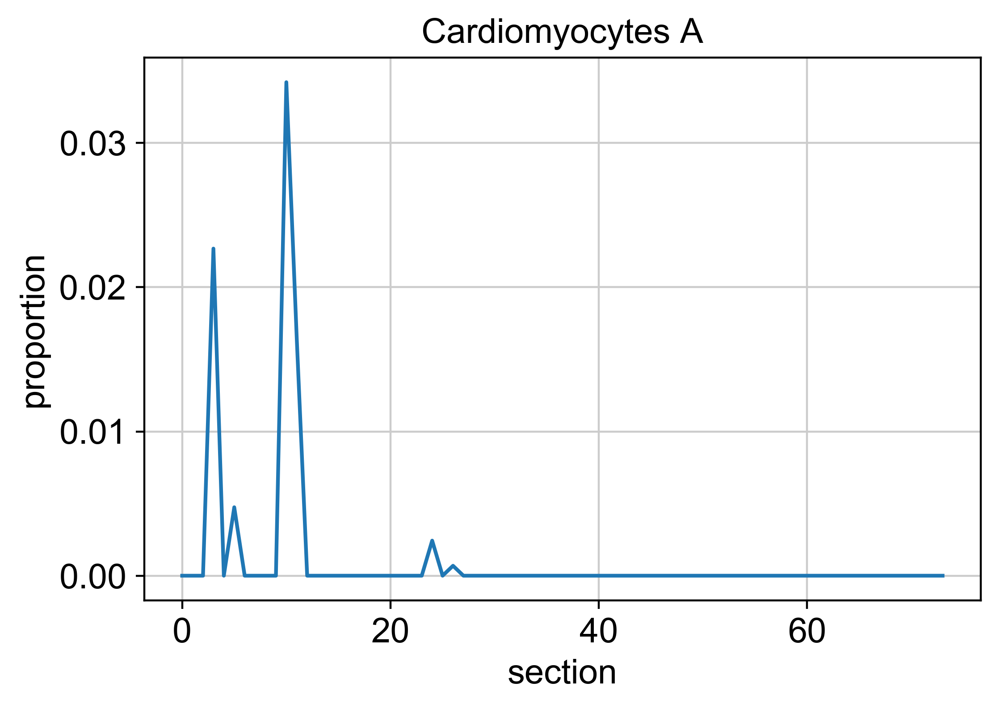

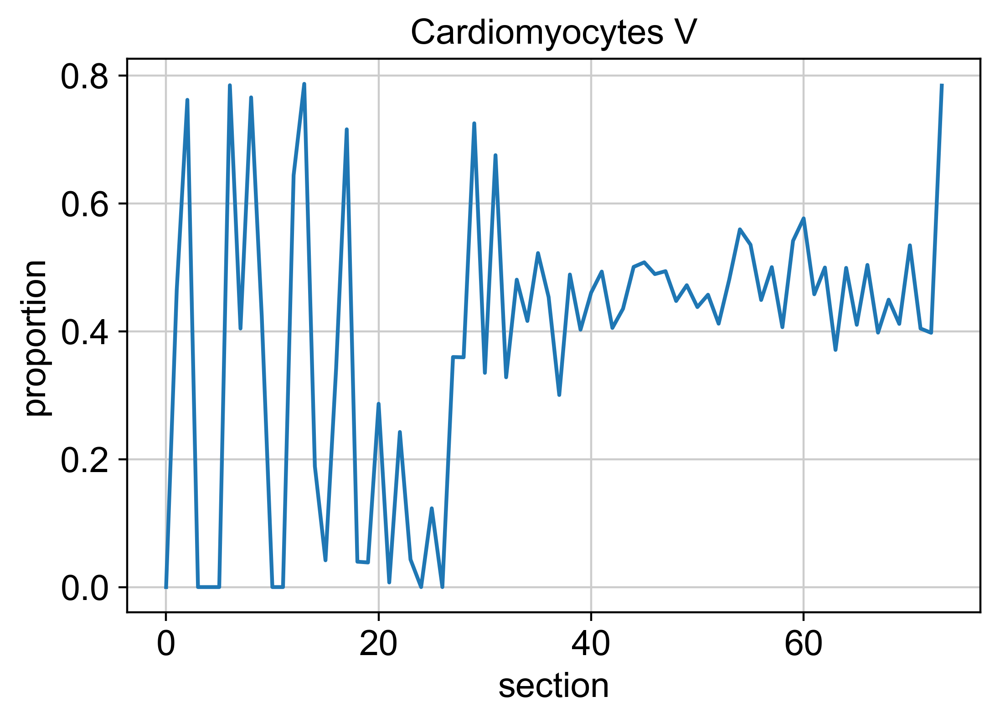

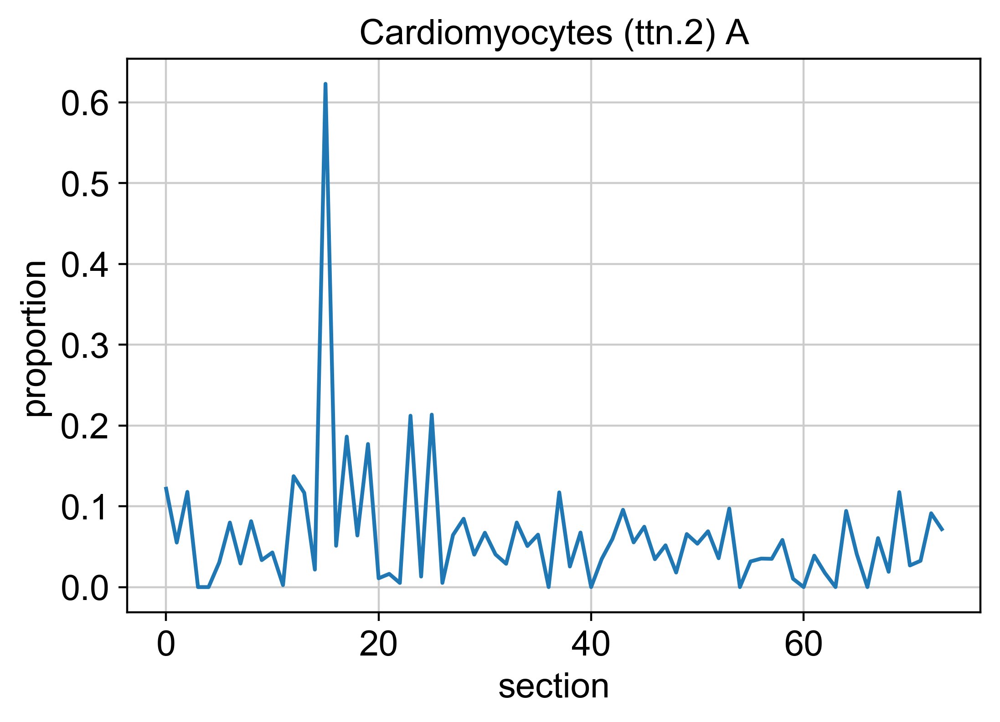

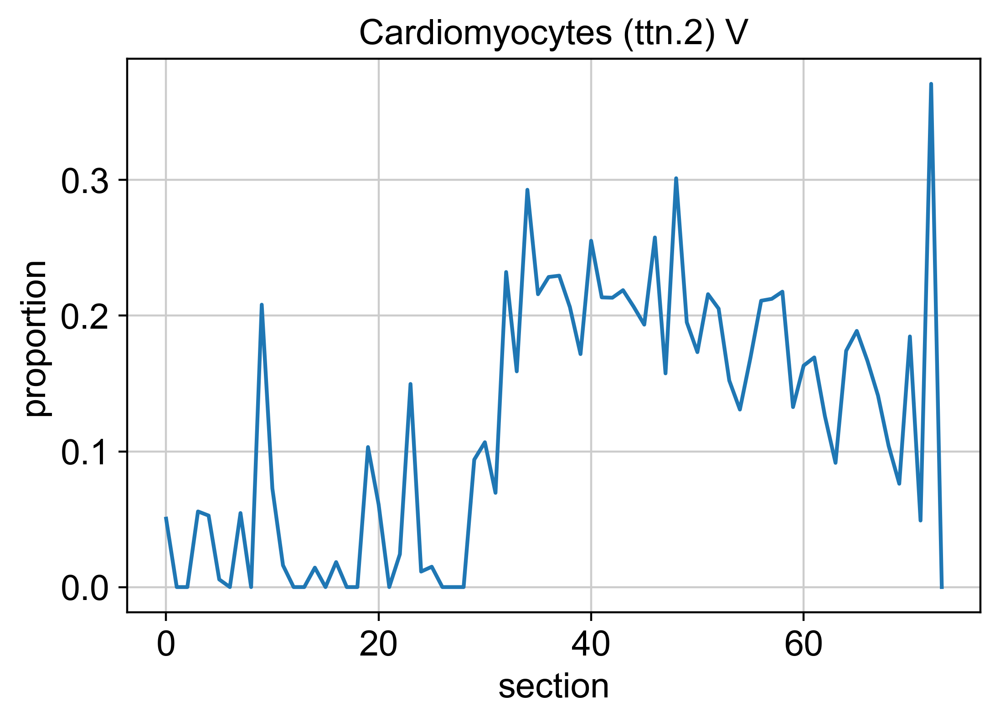

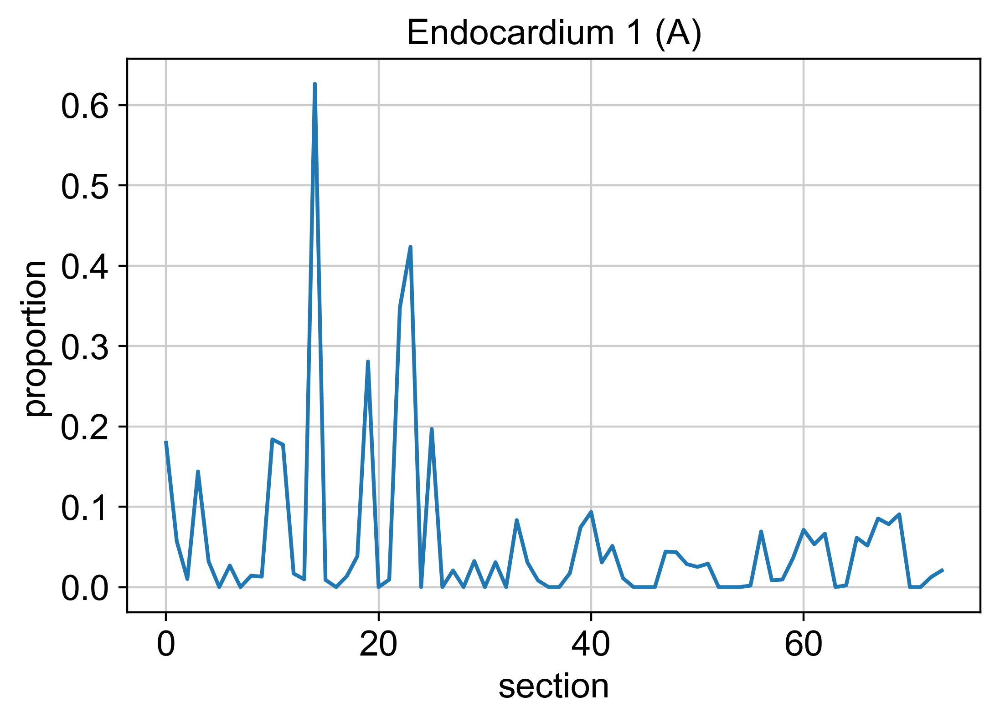

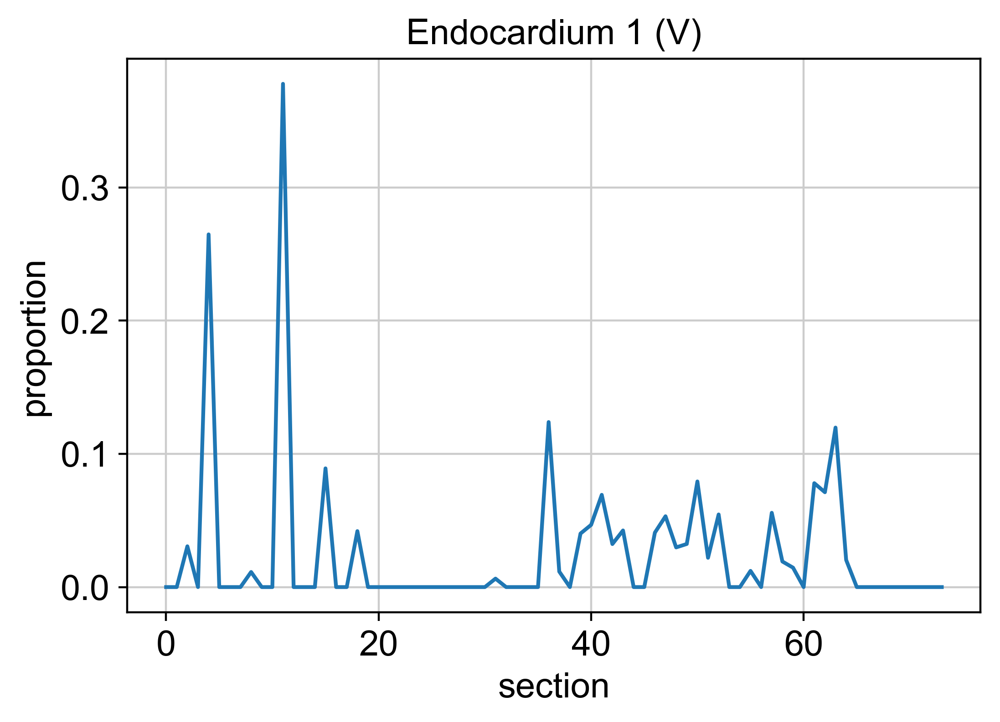

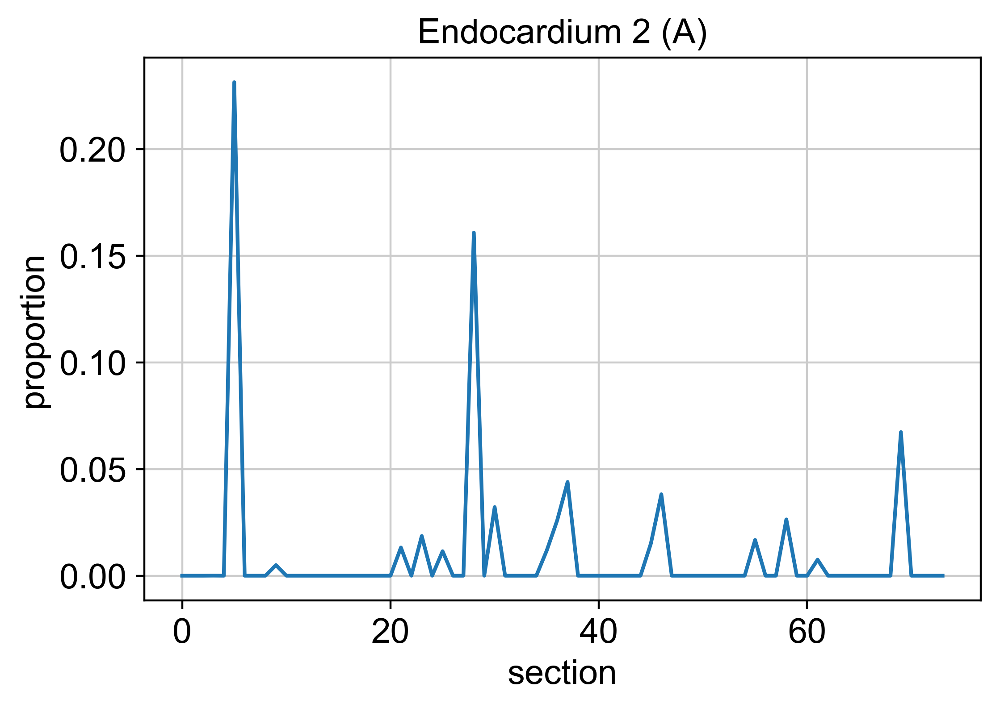

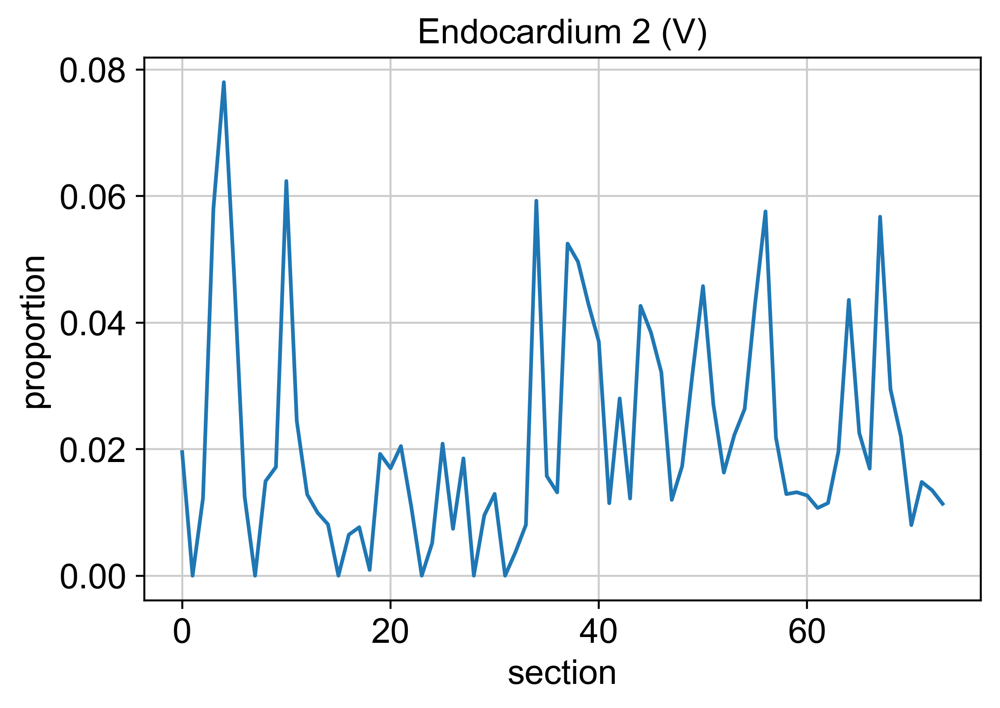

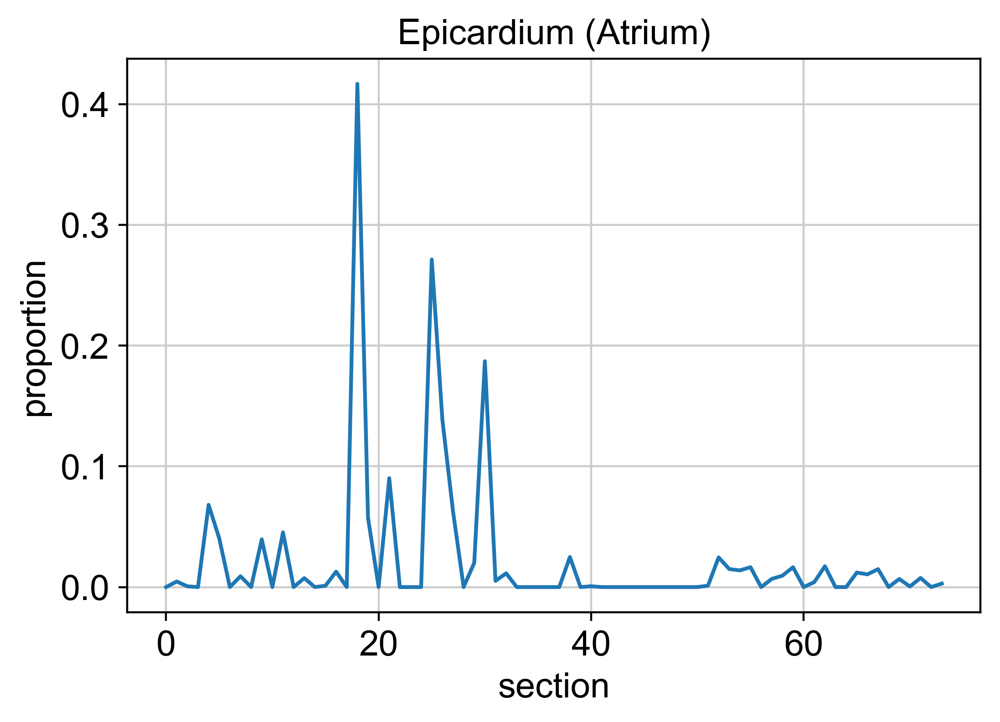

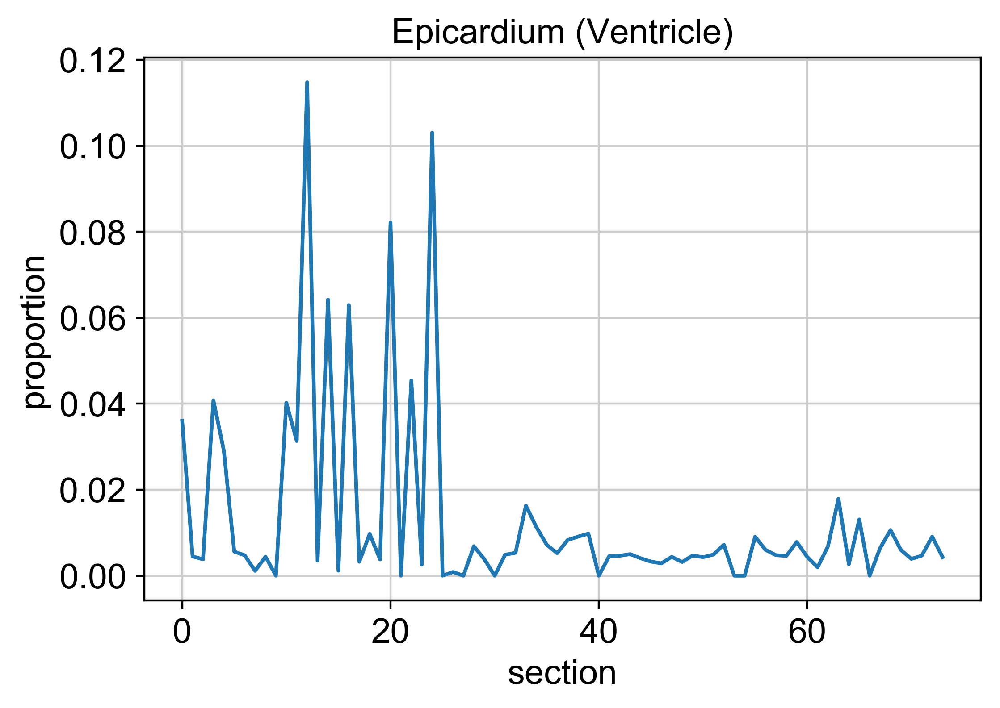

In [92]:
x_pos = [i for i, _ in enumerate(proportions_NuSVR_norm.index)]
for cell in ['Cardiomyocytes A', 'Cardiomyocytes V', 
             'Cardiomyocytes (ttn.2) A', 'Cardiomyocytes (ttn.2) V', 
             'Endocardium 1 (A)', 'Endocardium 1 (V)',
             'Endocardium 2 (A)', 'Endocardium 2 (V)',
             'Epicardium (Atrium)','Epicardium (Ventricle)']: #proportions_NuSVR_norm.columns:             
    plt.plot(x_pos,proportions_NuSVR_norm.loc[:,cell])
    plt.xlabel('section')
    plt.ylabel('proportion')
    plt.title(cell)
    plt.savefig(cell + '_2000gen_pareto240_NuSVR_AVonly_final_celltypes_tomo.png')
    plt.show()
# Atrial expression is very spiky; ventricular epicardium is in the atrium. Cardiomyocytes A are very 
# small proportion in atrium, cardiomyocytes V are large proportion in ventricle (but also very abundant in atrium).
# ttn2 atrial cardiomyocytes are mostly ubiquitous, apart from one section. 

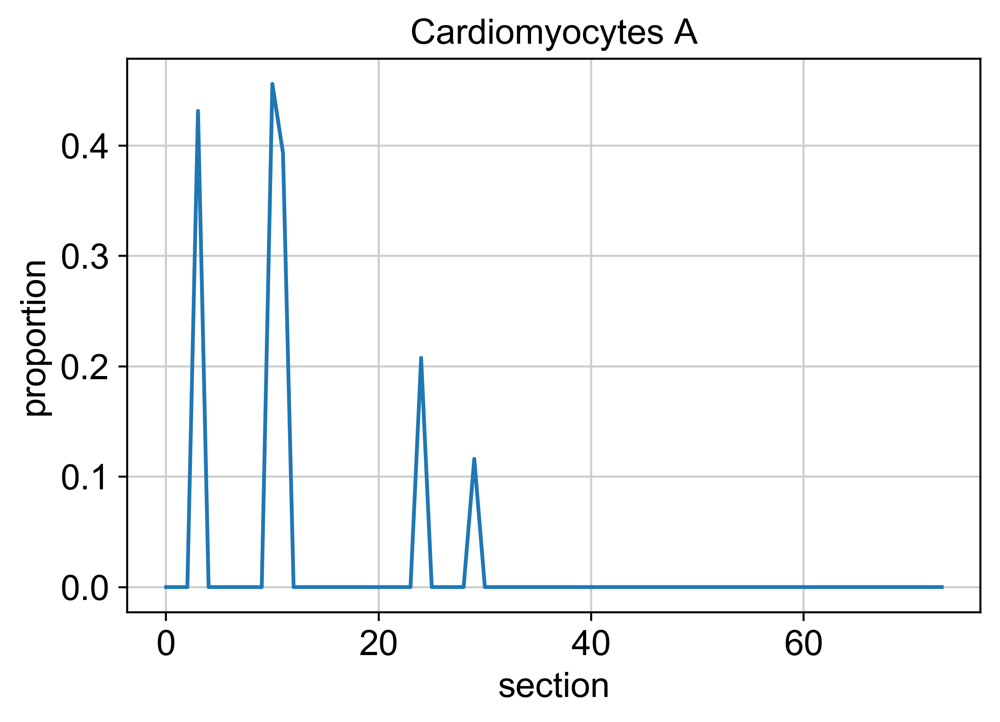

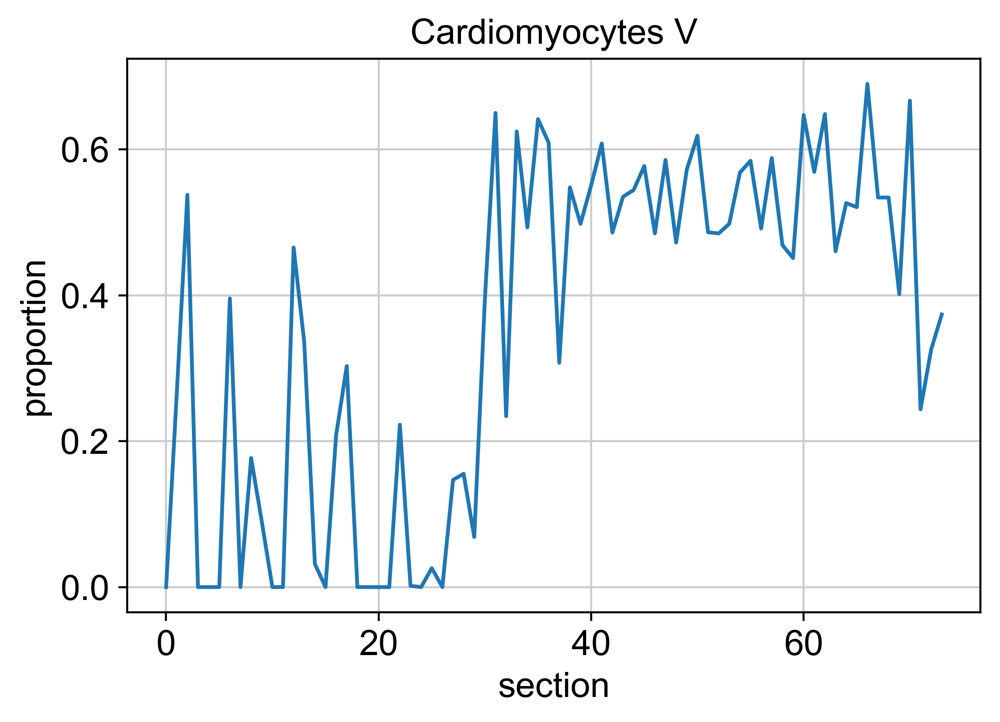

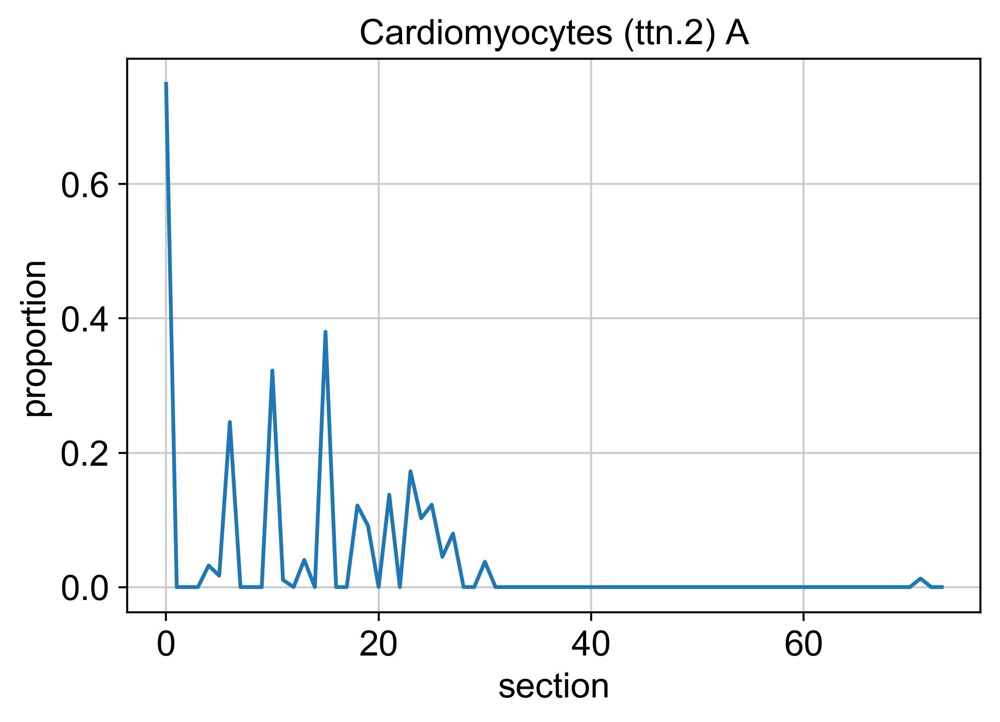

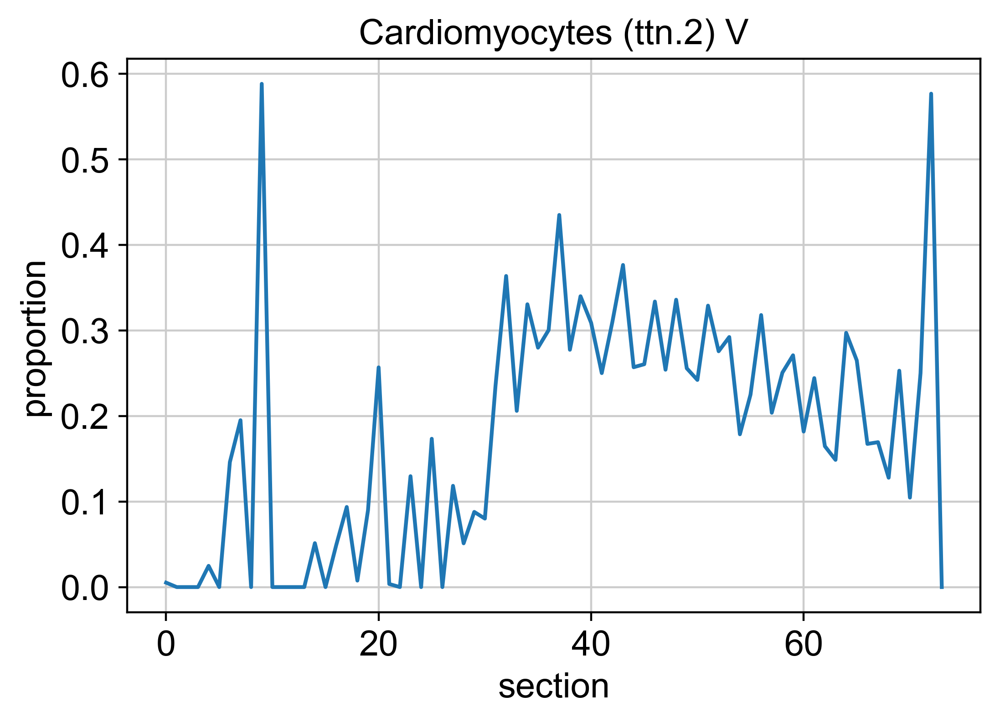

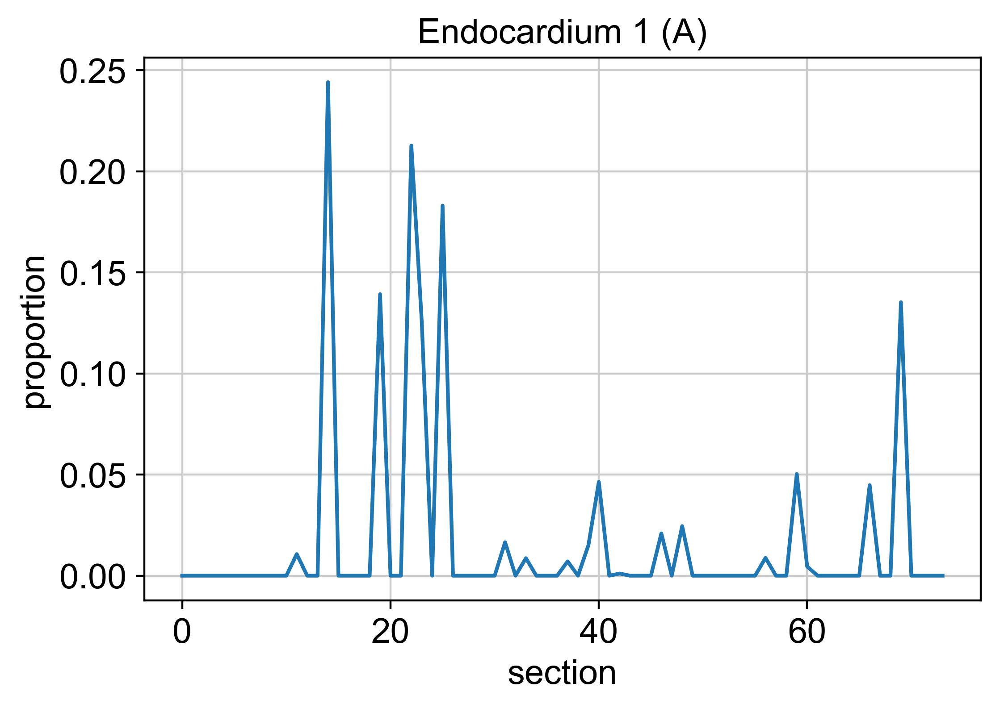

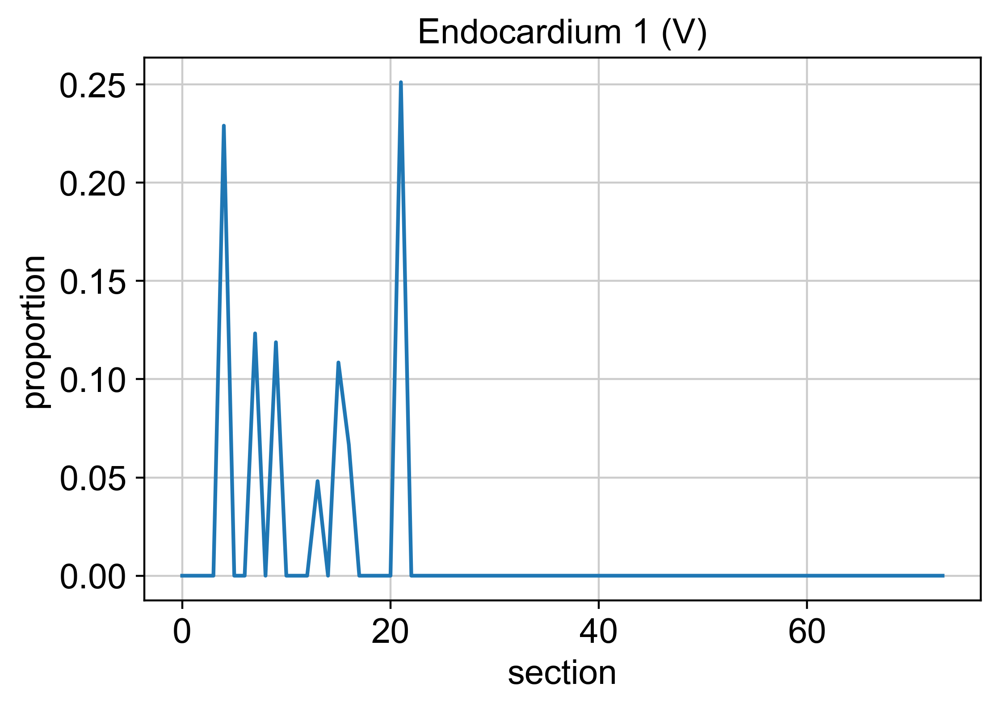

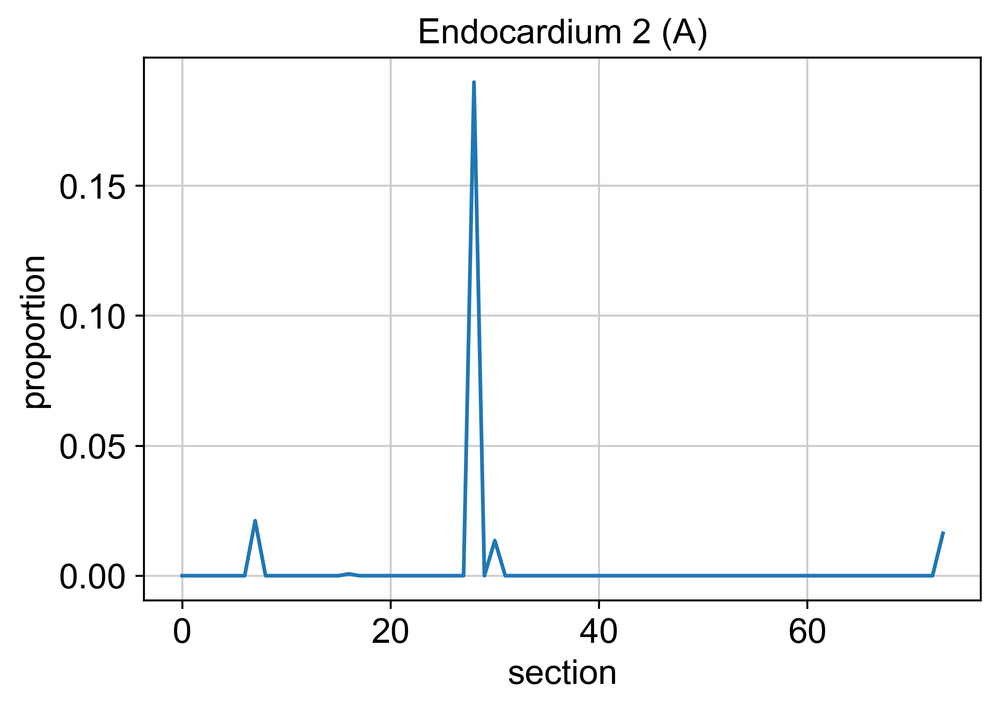

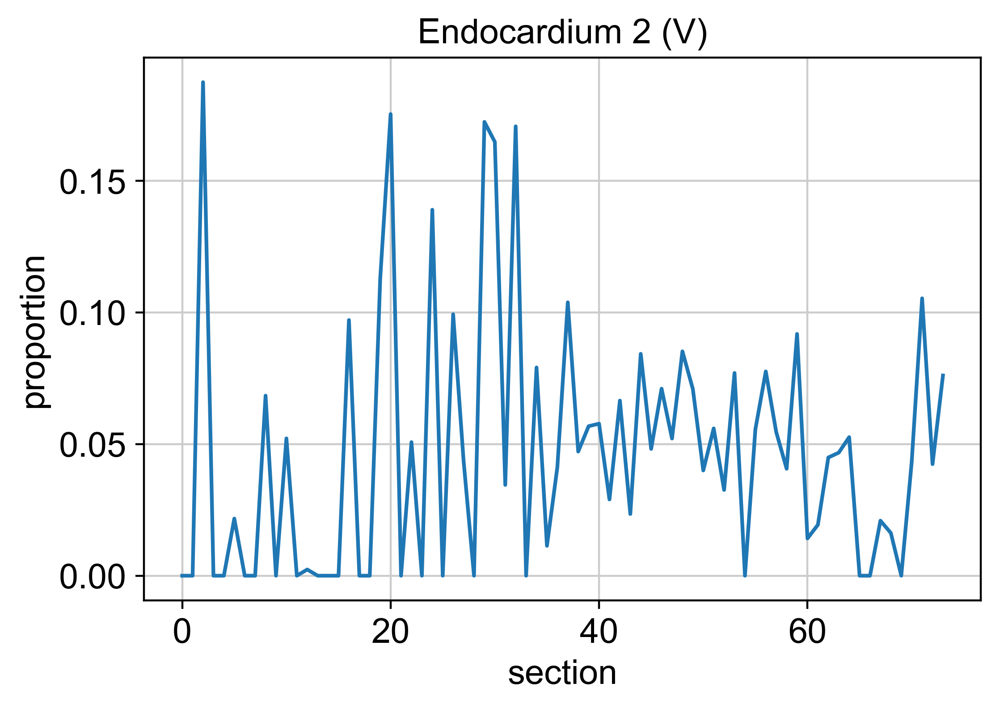

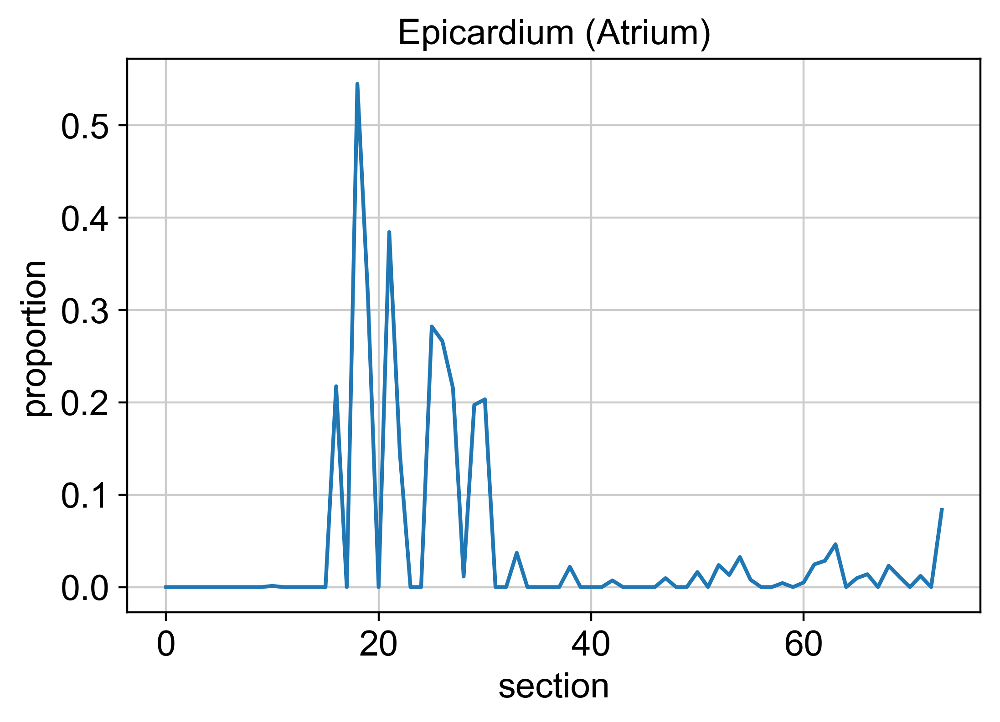

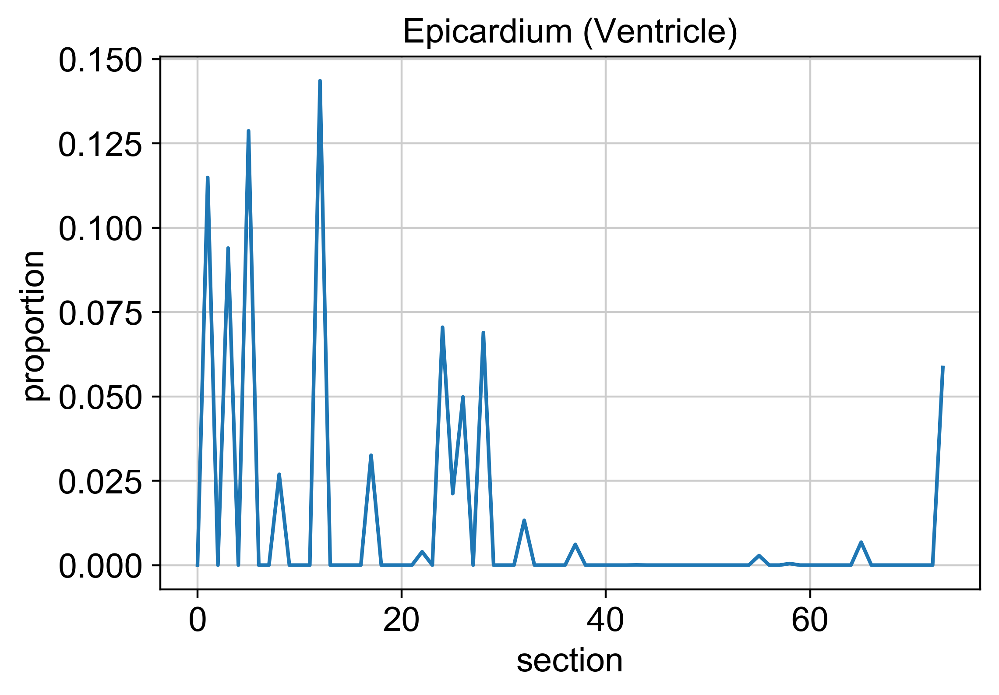

In [91]:
#x_pos = [i for i, _ in enumerate(proportions_nnls_norm.drop(['25'],axis=0).index)] # Why drop section 25?
x_pos = [i for i, _ in enumerate(proportions_nnls_norm.index)]
for cell in ['Cardiomyocytes A', 'Cardiomyocytes V', 
             'Cardiomyocytes (ttn.2) A', 'Cardiomyocytes (ttn.2) V', 
             'Endocardium 1 (A)', 'Endocardium 1 (V)',
             'Endocardium 2 (A)', 'Endocardium 2 (V)',
             'Epicardium (Atrium)','Epicardium (Ventricle)']: #proportions_nnls_norm.columns:
    #plt.plot(x_pos,proportions_nnls_norm.drop(['25'],axis=0).loc[:,cell])
    plt.plot(x_pos,proportions_nnls_norm.loc[:,cell])
    plt.xlabel('section')
    plt.ylabel('proportion')
    plt.title(cell)
    plt.savefig(cell + '_2000gen_pareto240_nnls_AVonly_final_celltypes_tomo.png')
    plt.show()
# Cardiomyocytes A is in atrium but quite sparse, CM V mostly ventricular but also quite present in atrium.
# CM ttn2 A is in atrium (spiky but clearly), CM ttn2 V is mostly in ventricle but also spikes in atrium.
# Endo 1 A is spiky in both but more in atrium, endo 1 (V) is only in atrium
# Endo 2 A is present in one section, endo 2 V is ubiquitous with higher baseline in ventricle.
# Epi A is spiky but atrial, epi V is spiky and atrial (but low proportion)

In [90]:
#proportions_nnls_norm.drop(['25'],axis=0)

,Epicardium (Atrium),Myelin cells,Cardiomyocytes (ttn.2) V,Endocardium 2 (V),Proliferating cells,Fibroblast (mpeg1.1),Endocardium 1 (V),B-cells,Bl.ves.EC (lyve1),Fibroblast (spock3),...,Monocytes,T-cells (il4/13),Cardiomyocytes V,Endocardium (frzb),Bl.ves.EC (apnln),Fibroblast,Fibroblast (cxcl12a),T-cells,Neuronal cells,Fibroblast-like cells
17,0,0,0.471784,0,0.093231,0,0,0,0,0,...,0,0,0,0,0,0.177894,0,0.0941397,0.00128538,0.0225651
18,0,0,0.618657,0,0.150995,0.0432614,0,0,0,0,...,0,0.00720207,0,0,0,0,0,0.0666359,0.00346246,0
19,0,0,0.652122,0.0159063,0,0,0,0,0,0.295459,...,0,0,0,0,0,0,0,0,0,0
22,0,0,0.666372,0,0,0,0.186892,0,0,0,...,0,0,0,0,0.000119313,0,0,0,0,0
23,0.558671,0,0.0342801,0,0.280127,0,0,0,0,0,...,0,0.00145792,0,0,0.00239712,0,0.00141645,0.0392212,0.00495695,0.00385167
24,0,0.000690848,0.166533,0.323559,0,0,0,0,0,0.294142,...,0,0.00377175,0,0,0,0,0,0.134701,0.000554761,0
26,0.0218962,0,0.742362,0,0.00297647,0,0,0,0,0,...,0.0360617,0,0,0,0.000838157,0,0,0,0.000886977,0
27,0.0701249,0,0.49377,0,0.0881522,0,0,0,0,0.0199385,...,0,0.000210984,0,0,0,0,0,0.120727,0,0
28,0,0,0.323021,0.048161,0.441161,0,0,0,0,0,...,0,0.00107432,0,0,0.000231115,0,0.0403166,0.0749121,0.0081208,0
29,0.162675,0,0.52583,0,0,0,0,0,0,0,...,0.0134286,0,0,0,0,0,0,0,0.00305967,0


In [79]:
#proportions_nnls_norm['Cardiomyocytes V']

17             0
18      0.264568
19      0.537685
22             0
23             0
24             0
25      0.395681
26             0
27      0.176867
28     0.0902636
29             0
30             0
31      0.465597
33       0.33569
34     0.0317767
35             0
36      0.208156
37      0.302992
38             0
39             0
40             0
41             0
42      0.222598
43    0.00166651
44             0
45     0.0259024
46             0
47      0.146904
48      0.155288
49     0.0686573
         ...    
64      0.544396
65      0.577216
66      0.484842
67       0.58559
68      0.472258
69      0.572192
70      0.618784
71      0.486473
72      0.484813
73      0.498071
74      0.568224
75      0.584383
76      0.491584
77      0.588221
78       0.46887
79      0.451052
80      0.647288
81      0.569153
82      0.648546
83      0.460365
84      0.526374
85      0.520842
86      0.689914
87      0.534062
88      0.534045
89      0.401437
90      0.666818
91      0.2437

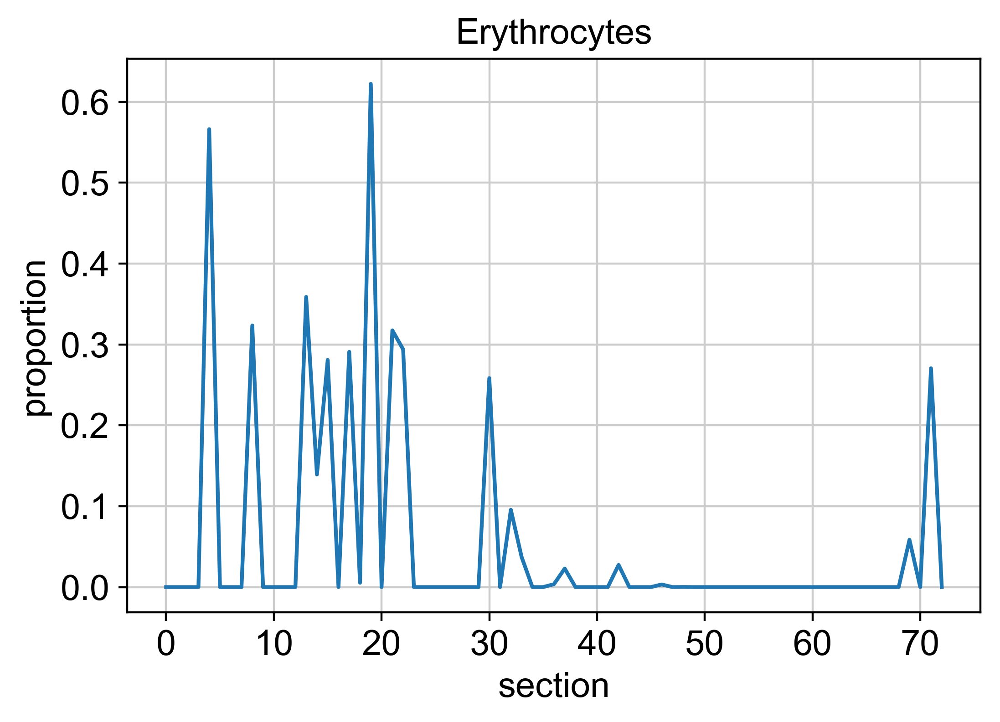

In [105]:
cell = 'Erythrocytes'
plt.plot(x_pos,proportions_nnls_norm.drop(['25'],axis=0).loc[:,cell])
plt.xlabel('section')
plt.ylabel('proportion')
plt.title(cell)
#plt.show()
plt.savefig('Plot_try.png')


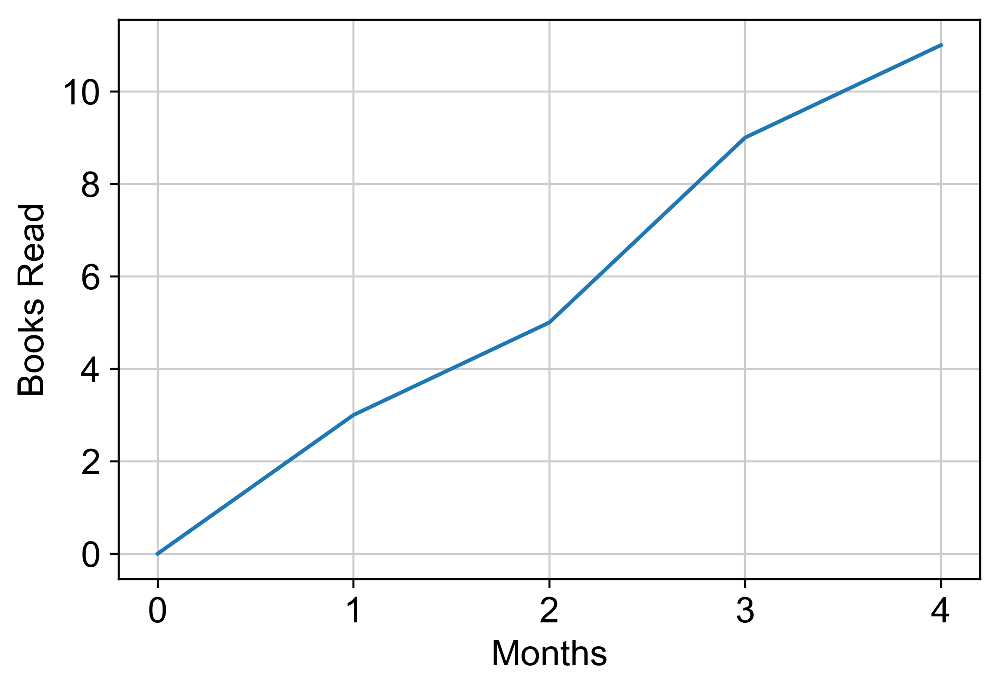

In [104]:
plt.plot([0, 1, 2, 3, 4], [0, 3, 5, 9, 11])
plt.xlabel('Months')
plt.ylabel('Books Read')
#plt.show()
plt.savefig('books_read.png')

In [57]:
proportions_NuSVR

,Cardiomyoctes (Atrium),Immune cells,Fibroblasts,Blood vessel Endothelia,Cardiac neurons,Cardiomyoctes (Ventricle),Endocardium (Atrium),Endocardium (Ventricle),Epicardium,Proliferating cells,Schwann cells,Erythrocytes,Smooth muscle cells
17,0.000189551,1.17164e-05,2.11975e-05,3.25072e-05,1.33634e-05,-7.19031e-06,-2.77847e-05,5.30426e-05,-1.3456e-05,1.4289e-05,6.2491e-06,-4.34365e-05,1.94575e-05
18,-1.46654e-05,1.53008e-05,1.25939e-06,1.30113e-06,-1.14689e-05,0.000128407,6.95574e-06,3.43035e-05,7.34325e-05,3.70547e-05,4.36383e-06,-2.72691e-05,9.03965e-06
19,2.32008e-05,1.14689e-05,4.25673e-05,3.00882e-05,1.61503e-06,0.000189312,-3.33722e-05,7.84798e-05,-1.6192e-05,5.27259e-06,1.29134e-05,1.16031e-05,2.04743e-05
22,6.8509e-05,-3.52091e-07,7.93651e-06,1.75935e-06,-1.16878e-05,-3.34533e-05,-1.077e-05,2.95043e-05,1.43583e-05,2.37141e-05,2.17388e-06,-2.06741e-05,1.62257e-05
23,0.00019643,6.03006e-06,7.26701e-06,-3.17123e-07,5.74912e-06,-6.03732e-06,-9.07209e-05,0.000106126,3.80424e-05,1.86736e-05,4.73037e-06,-6.64598e-06,4.53216e-05
24,0.000168757,-4.6067e-06,-5.42341e-06,-4.12824e-06,1.13376e-05,-1.90266e-05,6.82802e-06,-9.83769e-05,0.000339777,1.80852e-05,-9.13354e-06,-5.8548e-05,-1.81793e-06
25,-1.48237e-07,-6.88506e-06,-4.72085e-05,-1.12364e-05,2.88265e-06,0.000140136,5.36273e-06,1.14807e-05,-2.61184e-05,3.22723e-05,3.35812e-06,4.82957e-07,-3.7455e-05
26,-2.70927e-05,1.26946e-05,2.45203e-05,2.36743e-05,1.27321e-05,0.000850054,3.43243e-05,8.63001e-05,2.53633e-05,-1.26286e-05,6.54136e-06,-7.71371e-06,-2.60664e-06
27,1.04101e-05,6.06457e-06,-1.77458e-05,1.43078e-06,3.00821e-06,0.000211247,5.19411e-06,1.46747e-05,8.07927e-05,4.7916e-06,6.19772e-06,-8.84271e-06,2.37809e-05
28,-1.06692e-05,4.24218e-06,-1.52942e-05,8.18533e-07,1.76296e-07,9.11014e-05,-3.24943e-07,2.4045e-05,1.39213e-05,2.35427e-05,-1.22877e-05,1.21022e-05,1.23808e-05


In [52]:
proportions_NuSVR

,Endocardium (Ventricle),Endocardium (Atrium),Smooth muscle cells,Schwann cells,Epicardium,Immune cells,Blood vessel Endothelia,Cardiomyoctes (Ventricle),Proliferating cells,Cardiomyoctes (Atrium),Erythrocytes,Fibroblasts,Cardiac neurons
17,-4.82338e-06,3.48129e-06,-3.08328e-06,7.86006e-06,2.55576e-05,4.93369e-06,1.10722e-05,1.54254e-05,0.000105906,1.64704e-05,-0.000156459,-1.69408e-06,6.00014e-06
18,0.155449,-0.0147449,-0.00129214,0.000324108,0.00543675,-0.000498297,-0.00018918,0.11035,-0.00421092,-0.0158642,-0.00412951,-0.00268121,6.3475e-06
19,-1.25127e-05,2.82024e-05,-4.10528e-06,-4.5368e-06,-8.0712e-06,2.42941e-06,1.03805e-07,0.000775181,-1.79932e-05,-6.96191e-05,-2.14489e-05,9.7288e-06,-4.57077e-06
22,-2.73352e-05,4.06895e-05,6.5565e-07,1.23552e-05,-3.68304e-05,2.78786e-06,1.79355e-05,-1.37613e-05,0.000126675,0.000243151,-0.000185842,-6.45233e-06,3.85846e-06
23,-5.84688e-06,-1.53126e-05,3.79806e-06,8.15987e-06,2.18733e-05,5.31233e-06,2.8141e-08,-5.83566e-06,9.21275e-05,4.17062e-05,-0.000123901,-7.57628e-06,1.26267e-05
24,0.138906,-0.00707291,-0.000969484,-3.184e-05,-0.00303935,-0.000427104,-0.000132362,-0.00580368,-0.00785797,0.0162467,0.00638473,-0.000393994,-8.27684e-06
25,0.138468,-0.012419,-0.000968596,-3.19746e-05,-0.000795728,-0.000416295,-0.000253561,0.0976303,-0.0168825,-0.0142512,0.0149263,-0.00100666,-6.25731e-06
26,-2.84086e-05,2.41608e-05,-5.34993e-06,-9.13207e-06,1.09418e-05,-1.47729e-06,1.13038e-05,0.000758241,1.06838e-05,-7.94101e-05,-5.36978e-05,2.3507e-05,7.86909e-06
27,0.213946,-0.0202162,-0.00161945,0.00053363,0.0111416,-0.000598854,0.00128433,0.0876384,-0.00381029,0.000634345,-0.00596568,-0.00603646,0.00147931
28,-0.0025186,0.00142973,-0.000901371,-1.73083e-05,-0.000354478,-0.000525778,0.00188651,0.181004,-0.00753317,-0.0190383,0.000402142,0.00309872,-1.31812e-05


In [1]:
x_pos = [i for i, _ in enumerate(proportions_nnls_norm.drop(['25'],axis=0).index)]
for cell in proportions_nnls_norm.columns:
    plt.plot(x_pos,proportions_nnls_norm.drop(['25'],axis=0).loc[:,cell])
    plt.xlabel('section')
    plt.ylabel('proportion')
    plt.title(cell)
    plt.show()

NameError: name 'proportions_nnls_norm' is not defined

# Subsampling

In [53]:
#deconvolving subsamples and get a confidence interval 

In [56]:
tomoData_Resample = pd.read_csv('../data/Tomo1_Resample.csv',index_col=0) #Tomo1_count_table.csv
tomoaData_Resample_norm = sc.AnnData(tomoData_Resample.T)
sc.pp.normalize_per_cell(tomoaData_Resample_norm, counts_per_cell_after=1e4)
tomoData_Resample_norm = pd.DataFrame(data=tomoaData_Resample_norm.X.T,columns = tomoaData_Resample_norm.obs_names, index=tomoaData_Resample_norm.var_names)

In [58]:
tomoData_Resample_norm.shape

(18540, 7400)

In [59]:
tomoData_Resample_norm.columns

Index(['Sec_ X17 :sam_ 1', 'Sec_ X17 :sam_ 2', 'Sec_ X17 :sam_ 3',
       'Sec_ X17 :sam_ 4', 'Sec_ X17 :sam_ 5', 'Sec_ X17 :sam_ 6',
       'Sec_ X17 :sam_ 7', 'Sec_ X17 :sam_ 8', 'Sec_ X17 :sam_ 9',
       'Sec_ X17 :sam_ 10',
       ...
       'Sec_ X94 :sam_ 91', 'Sec_ X94 :sam_ 92', 'Sec_ X94 :sam_ 93',
       'Sec_ X94 :sam_ 94', 'Sec_ X94 :sam_ 95', 'Sec_ X94 :sam_ 96',
       'Sec_ X94 :sam_ 97', 'Sec_ X94 :sam_ 98', 'Sec_ X94 :sam_ 99',
       'Sec_ X94 :sam_ 100'],
      dtype='object', length=7400)

In [60]:
proportions_nnls_resample = pd.DataFrame(index=tomoData_Resample_norm.columns,columns=centroids_sc_pareto.columns)
for s in tomoData_Resample_norm.columns:
    proportions_nnls_resample.loc[s] = sci.optimize.nnls(centroids_sc_pareto,tomoData_Resample_norm.loc[centroids_sc_pareto.index,s])[0]
proportions_nnls_norm = normalize_proportions(proportions_nnls_resample, copy = True)

In [141]:
proportions_nnls_resample

,Schwann cells,Endocardium (Atrium),Fibroblasts,Blood vessel Endothelia,Smooth muscle cells,Immune cells,Endocardium (Ventricle),Cardiomyoctes (Atrium),Cardiac neurons,Proliferating cells,Cardiomyoctes (Ventricle),Erythrocytes,Epicardium
Sec_ X17 :sam_ 1,0,0,0.0728574,0,0,0,0,0.425833,0,0,0,0,0.0593701
Sec_ X17 :sam_ 2,0,0,0,0,0.0338512,0,0,0.245997,0.0130157,0.0211255,0,0,0.036842
Sec_ X17 :sam_ 3,0,0,0.0746879,0,0,0,0,0.436623,0.00095766,0,0,0,0.00477767
Sec_ X17 :sam_ 4,0,0,0.263836,0,0,0.0002676,0.0304261,0,0,0,0,0,0.062239
Sec_ X17 :sam_ 5,0,0,0.0594736,0,0,0,0,0.843871,0.00246712,0,0,0,0.0443256
Sec_ X17 :sam_ 6,0,0,0.17014,0,0,0,0,0.227689,0.00228572,0.00157558,0,0,0.0333473
Sec_ X17 :sam_ 7,0,0,0,0,0.0510564,0,0,0.211567,0.0137946,0,0,0,0.104147
Sec_ X17 :sam_ 8,0,0,0.00085625,0,0.0247964,0.000943999,0.0515584,0.0155555,4.93169e-05,0.0214752,0.00306705,0,0.00659686
Sec_ X17 :sam_ 9,0,0,0.0790172,0,0,0,0,0.240271,0.00228928,0.0145656,0,0,0.00510295
Sec_ X17 :sam_ 10,0,0,0.161763,0,0,0,0,0.408962,0,0,0,0,0.0820696


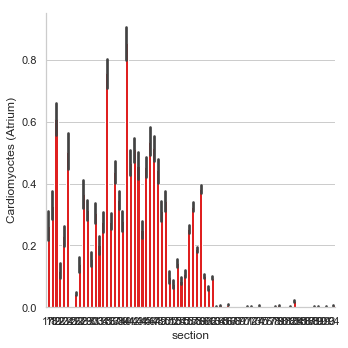

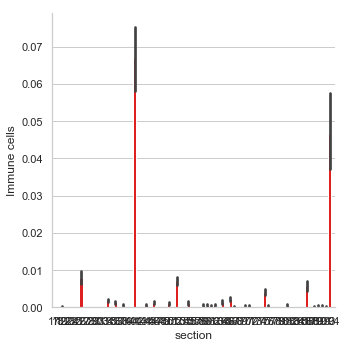

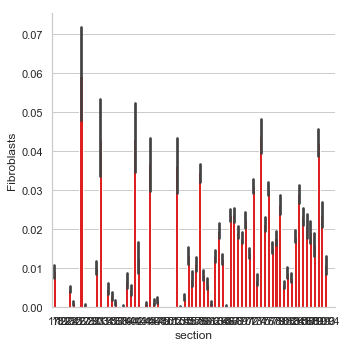

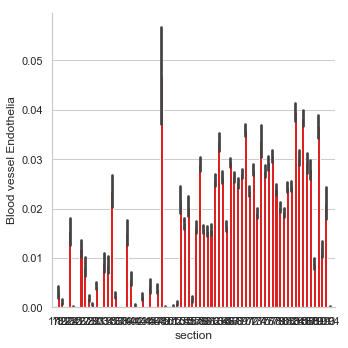

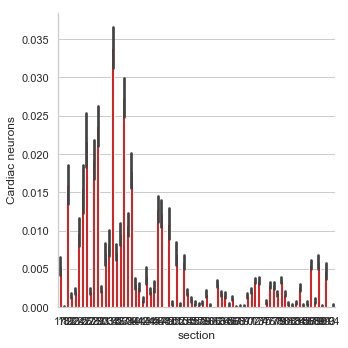

...

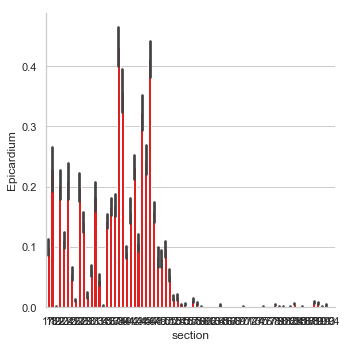

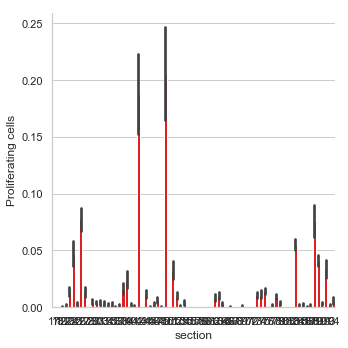

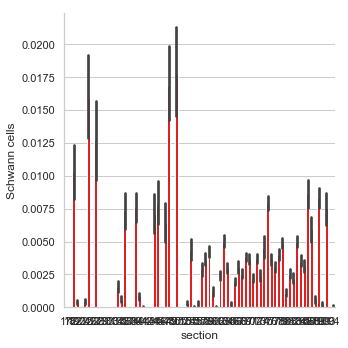

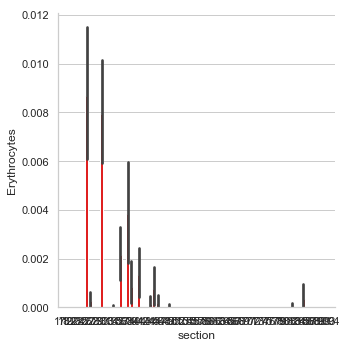

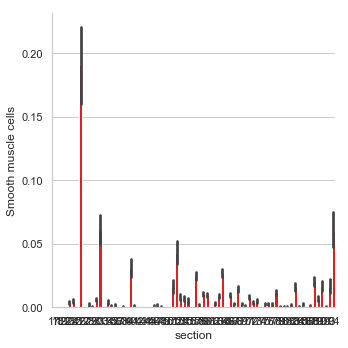

In [70]:
proportions_nnls_resample.loc[:,"section"]=proportions_nnls_resample.index.str[6:8]
sns.set(rc={'figure.figsize':(20,8)})
sns.set(style="whitegrid")
for celltype in proportions_nnls_resample.columns:
    if celltype!='section':
        #sns.barplot(x="section", y=celltype, data=proportions_nnls_resample, capsize=.2)
        sns.catplot(x="section", y=celltype, data=proportions_nnls_resample,
                kind="bar",color='red')
        #sns.boxplot(data=proportions_nnls_resample,x="section",y=celltype,color='red')

In [175]:
def plot_pdf(data):
    mu, std = sci.stats.norm.fit(data)

    # Plot the histogram.
    print(np.count_nonzero(data))
    if np.count_nonzero(data)!=0 && mu!=np.nan && std!=nan:
        print(data)
        plt.hist(np.array(data), bins=10, density=True, alpha=0.6, color='g')

    # Plot the PDF.
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = sci.stats.norm.pdf(x, mu, std)
    plt.plot(x, p, 'k', linewidth=2)
    title = "Fit results: mu = %.2f,  std = %.2f" % (mu, std)
    plt.title(title)

    plt.show()
    return

In [63]:
mus = pd.DataFrame(columns=proportions_nnls_resample.columns,index=tomoData.columns)
stds = pd.DataFrame(columns=proportions_nnls_resample.columns,index=tomoData.columns)
for s in tomoData.columns:
    section_samples = proportions_nnls_resample.loc[[x for x in proportions_nnls_resample.index if 'X'+str(s) in x],:]
    for celltype in proportions_nnls_resample.columns:
        #print(sci.stats.t.pdf(section_samples.loc[:,celltype],df=1))
        data = section_samples.loc[:,celltype]
        mu, std = sci.stats.norm.fit(list(data))
        mus.loc[s,celltype] = mu
        stds.loc[s,celltype] = std
        #plot_pdf(data)

Cardiomyoctes (Atrium)


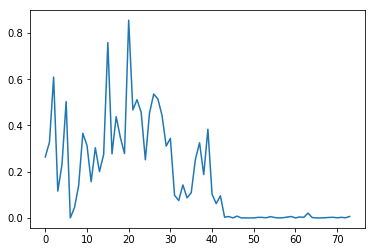

Immune cells


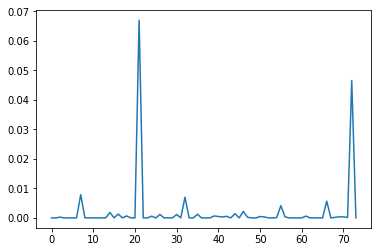

Fibroblasts


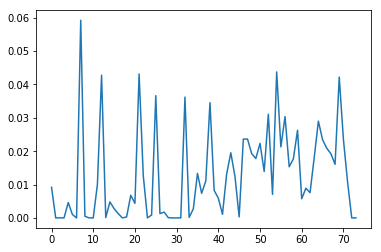

Blood vessel Endothelia


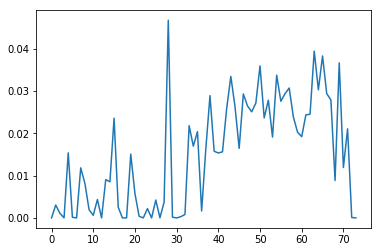

Cardiac neurons


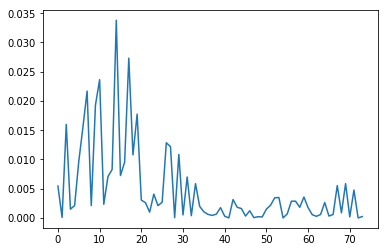

Cardiomyoctes (Ventricle)


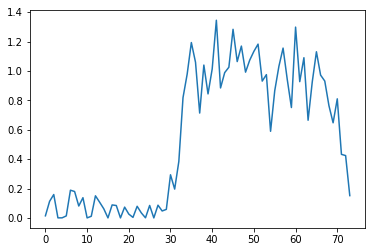

Endocardium (Atrium)


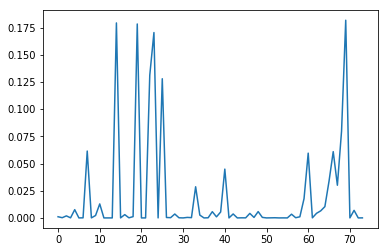

Endocardium (Ventricle)


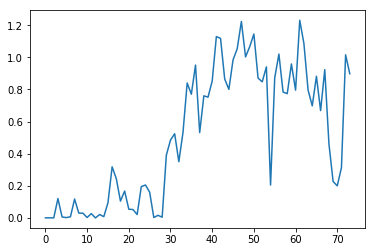

Epicardium


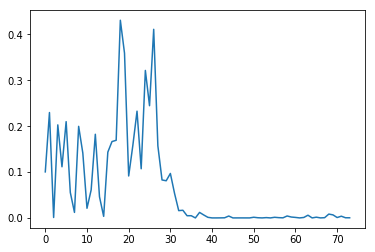

Proliferating cells


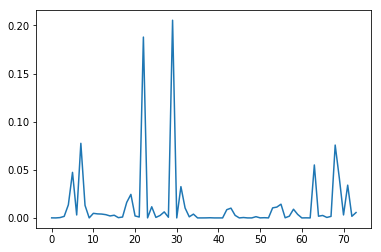

Schwann cells


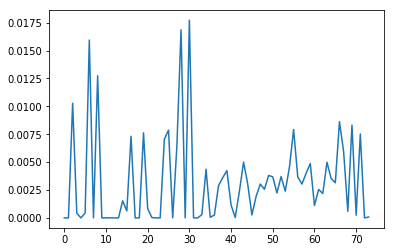

Erythrocytes


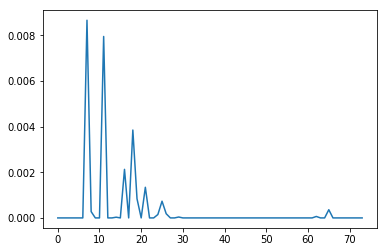

Smooth muscle cells


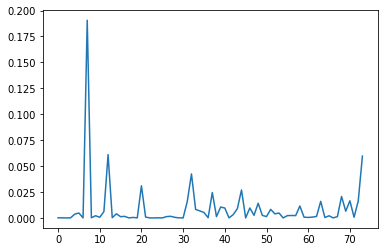

In [64]:
for cell in mus.columns:
    plt.plot(x_pos,mus.loc[:,cell])
    print(cell)
    plt.show()

In [66]:
mus.fillna(value=np.nan, inplace=True)
stds.fillna(value=np.nan, inplace=True)

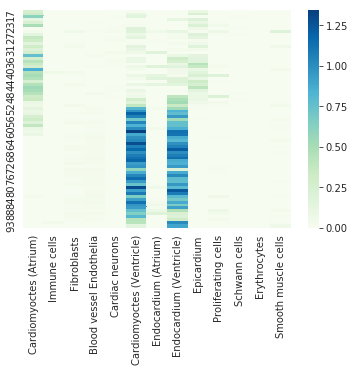

In [67]:
with sns.axes_style("white"):
    sns.heatmap(mus,cmap=sns.color_palette("GnBu", 1000))

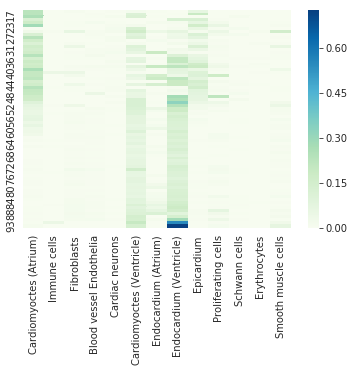

In [68]:
with sns.axes_style("white"):
    sns.heatmap(stds,cmap=sns.color_palette("GnBu", 1000))

In [ ]:
fig, ax = plt_.subplots()
ax.set_title('standard error (%)')
es = [x*100 for x in es]
es_raw = [x*100 for x in es_raw]
es_mg = [x*100 for x in es_mg]
bplot = ax.boxplot([es,es_raw,es_mg], patch_artist=True, showfliers=False)
colors = ['red', 'blue', 'green']
for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)
ax.set_xticklabels(['MOO-based genes', 'HV genes','marker genes'])
plt.show()